# 🔬 PathMNIST Explainable AI (XAI) Project

Complete XAI pipeline for medical image classification.

---

## 📦 Section 1: Setup and Data Loading

### 1.1 Install and Import

In [1]:
# Install medmnist package
!pip install medmnist
!pip install captum

In [2]:
# Standard library imports
import time
import warnings
warnings.filterwarnings('ignore')

# Data manipulation and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Scikit-learn utilities
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import classification_report, confusion_matrix, balanced_accuracy_score
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import cosine
import sklearn

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms, models

# MedMNIST
import medmnist
from medmnist import PathMNIST, INFO

# Captum (Explainability)
from captum.attr import (
    IntegratedGradients,
    LayerGradCam,
    Saliency,
    visualization as viz
)

# Progress bar
from tqdm.auto import tqdm

# Print versions
print("="*60)
print("Library Versions:")
print("="*60)
print(f"NumPy version: {np.__version__}")
print(f"Pandas version: {pd.__version__}")
print(f"PyTorch version: {torch.__version__}")
print(f"Scikit-learn version: {sklearn.__version__}")
print(f"MedMNIST version: {medmnist.__version__}")
print("="*60)

Library Versions:
NumPy version: 1.26.4
Pandas version: 2.2.3
PyTorch version: 2.6.0+cu124
Scikit-learn version: 1.2.2
MedMNIST version: 3.0.2


### 1.2 Dataset Information

In [3]:
# Get PathMNIST information
info = INFO['pathmnist']
print("\n📊 PathMNIST Dataset Information:")
print("="*60)
print(f"Task: {info['task']}")
print(f"Number of Classes: {info['n_channels']}")
print(f"Description: {info['description']}")
print(f"License: {info['license']}")
print("="*60)



📊 PathMNIST Dataset Information:
Task: multi-class
Number of Classes: 3
Description: The PathMNIST is based on a prior study for predicting survival from colorectal cancer histology slides, providing a dataset (NCT-CRC-HE-100K) of 100,000 non-overlapping image patches from hematoxylin & eosin stained histological images, and a test dataset (CRC-VAL-HE-7K) of 7,180 image patches from a different clinical center. The dataset is comprised of 9 types of tissues, resulting in a multi-class classification task. We resize the source images of 3×224×224 into 3×28×28, and split NCT-CRC-HE-100K into training and validation set with a ratio of 9:1. The CRC-VAL-HE-7K is treated as the test set.
License: CC BY 4.0


### 1.3 Download Datasets

In [4]:
# Download and load train, validation, and test datasets
print("\n⬇️  Downloading PathMNIST dataset...")
print("="*60)

train_dataset = PathMNIST(split='train', download=True)
val_dataset = PathMNIST(split='val', download=True)
test_dataset = PathMNIST(split='test', download=True)

print("✅ Download complete!")
print("="*60)



⬇️  Downloading PathMNIST dataset...


100%|██████████| 206M/206M [01:53<00:00, 1.82MB/s] 


✅ Download complete!


### 1.4 Dataset Sizes

In [5]:
# Display dataset sizes
print("\n📦 Dataset Size Information:")
print("="*60)
print(f"Training samples: {len(train_dataset):,}")
print(f"Validation samples: {len(val_dataset):,}")
print(f"Test samples: {len(test_dataset):,}")
print(f"Total samples: {len(train_dataset) + len(val_dataset) + len(test_dataset):,}")
print("="*60)

# Get image and label shapes
sample_img, sample_label = train_dataset[0]
print(f"\n🖼️  Image Shape: {np.array(sample_img).shape}")
print(f"🏷️  Label Shape: {sample_label.shape}")
print(f"🎨 Image Type: RGB")
print(f"📏 Resolution: 28x28 pixels")
print("="*60)



📦 Dataset Size Information:
Training samples: 89,996
Validation samples: 10,004
Test samples: 7,180
Total samples: 107,180

🖼️  Image Shape: (28, 28, 3)
🏷️  Label Shape: (1,)
🎨 Image Type: RGB
📏 Resolution: 28x28 pixels


### 1.5 Class Distribution

In [6]:
# Display class distribution
print("\n📈 Class Distribution:")
print("="*60)

# Class names
class_names = [
    'Adipose (ADI)',
    'Background (BACK)',
    'Debris (DEB)',
    'Lymphocytes (LYM)',
    'Mucus (MUC)',
    'Smooth Muscle (MUS)',
    'Normal Colon Mucosa (NORM)',
    'Cancer-Associated Stroma (STR)',
    'Colorectal Adenocarcinoma Epithelium (TUM)'
]

# Count classes in each split
for split_name, dataset in [('Train', train_dataset), ('Val', val_dataset), ('Test', test_dataset)]:
    labels = [dataset[i][1].item() for i in range(len(dataset))]
    unique, counts = np.unique(labels, return_counts=True)

    print(f"\n{split_name} Set:")
    for cls_idx, count in zip(unique, counts):
        print(f"  Class {cls_idx} ({class_names[cls_idx]}): {count:,} samples")
    print(f"  Total: {len(dataset):,}")

print("="*60)



📈 Class Distribution:

Train Set:
  Class 0 (Adipose (ADI)): 9,366 samples
  Class 1 (Background (BACK)): 9,509 samples
  Class 2 (Debris (DEB)): 10,360 samples
  Class 3 (Lymphocytes (LYM)): 10,401 samples
  Class 4 (Mucus (MUC)): 8,006 samples
  Class 5 (Smooth Muscle (MUS)): 12,182 samples
  Class 6 (Normal Colon Mucosa (NORM)): 7,886 samples
  Class 7 (Cancer-Associated Stroma (STR)): 9,401 samples
  Class 8 (Colorectal Adenocarcinoma Epithelium (TUM)): 12,885 samples
  Total: 89,996

Val Set:
  Class 0 (Adipose (ADI)): 1,041 samples
  Class 1 (Background (BACK)): 1,057 samples
  Class 2 (Debris (DEB)): 1,152 samples
  Class 3 (Lymphocytes (LYM)): 1,156 samples
  Class 4 (Mucus (MUC)): 890 samples
  Class 5 (Smooth Muscle (MUS)): 1,354 samples
  Class 6 (Normal Colon Mucosa (NORM)): 877 samples
  Class 7 (Cancer-Associated Stroma (STR)): 1,045 samples
  Class 8 (Colorectal Adenocarcinoma Epithelium (TUM)): 1,432 samples
  Total: 10,004

Test Set:
  Class 0 (Adipose (ADI)): 1,338 s

### 1.6 Sample Visualization


🖼️  Displaying sample images from each class...


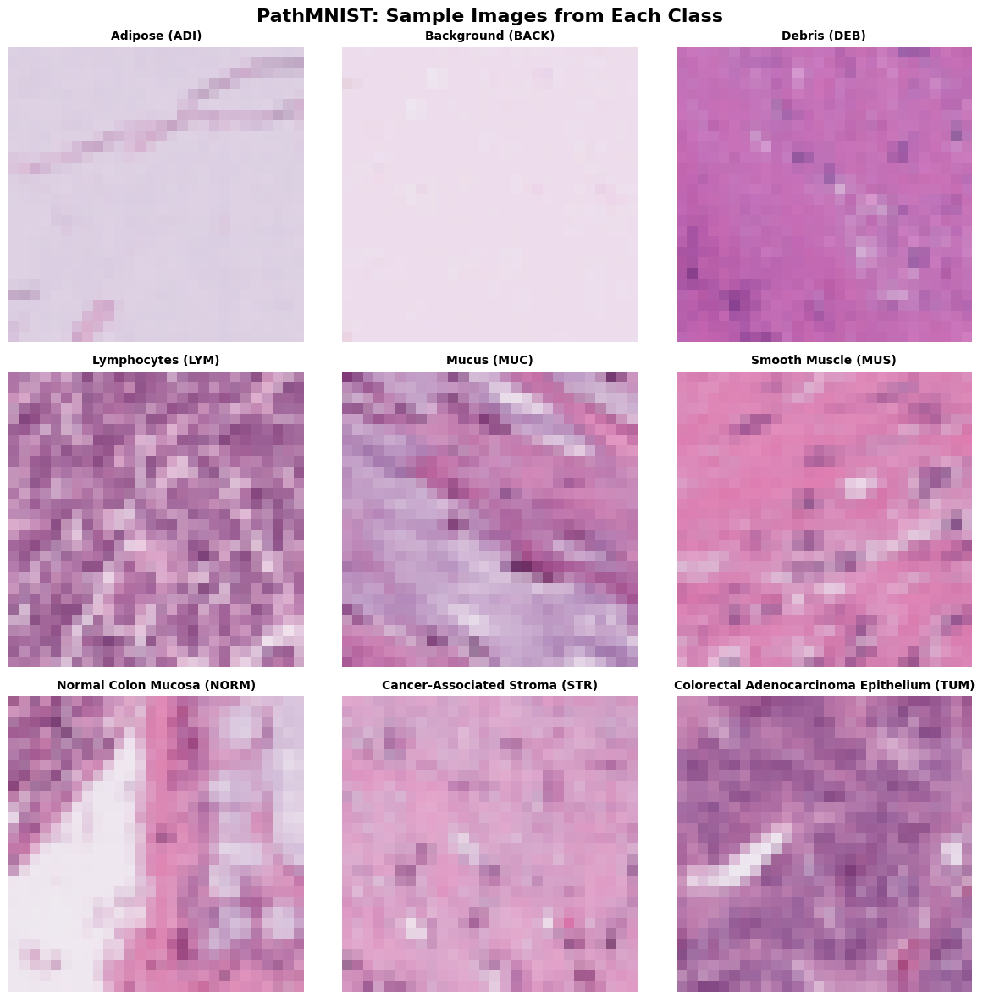


💾 Estimated Memory Usage:
Total dataset size: ~240.41 MB
Train set: ~201.86 MB
Validation set: ~22.44 MB
Test set: ~16.11 MB

✅ Dataset ready for XAI project!


In [7]:
# Visualize sample images from each class
print("\n🖼️  Displaying sample images from each class...")

fig, axes = plt.subplots(3, 3, figsize=(12, 12))
fig.suptitle('PathMNIST: Sample Images from Each Class', fontsize=16, fontweight='bold')

for cls_idx in range(9):
    # Find first image of this class
    for i in range(len(train_dataset)):
        img, label = train_dataset[i]
        if label.item() == cls_idx:
            row = cls_idx // 3
            col = cls_idx % 3
            axes[row, col].imshow(np.array(img))
            axes[row, col].set_title(f'{class_names[cls_idx]}', fontsize=10, fontweight='bold')
            axes[row, col].axis('off')
            break

plt.tight_layout()
plt.show()

# Display memory usage estimate
print("\n💾 Estimated Memory Usage:")
print("="*60)
img_size_bytes = 28 * 28 * 3  # RGB image
total_images = len(train_dataset) + len(val_dataset) + len(test_dataset)
total_mb = (img_size_bytes * total_images) / (1024 * 1024)
print(f"Total dataset size: ~{total_mb:.2f} MB")
print(f"Train set: ~{(img_size_bytes * len(train_dataset)) / (1024 * 1024):.2f} MB")
print(f"Validation set: ~{(img_size_bytes * len(val_dataset)) / (1024 * 1024):.2f} MB")
print(f"Test set: ~{(img_size_bytes * len(test_dataset)) / (1024 * 1024):.2f} MB")
print("="*60)

print("\n✅ Dataset ready for XAI project!")

---

## 📊 Section 2: Exploratory Data Analysis

### 2.1 Setup

In [8]:
# ========================================
# COMPREHENSIVE EDA FOR PATHMNIST XAI PROJECT
# ========================================
# Set style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (15, 10)

class_names = [
    'Adipose (ADI)',
    'Background (BACK)',
    'Debris (DEB)',
    'Lymphocytes (LYM)',
    'Mucus (MUC)',
    'Smooth Muscle (MUS)',
    'Normal Colon Mucosa (NORM)',
    'Cancer-Associated Stroma (STR)',
    'Colorectal Adenocarcinoma Epithelium (TUM)'
]

class_short = ['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']


### 2.2 Class Imbalance Analysis

🔬 PATHMNIST EXPLORATORY DATA ANALYSIS FOR XAI

📊 1. CLASS IMBALANCE ANALYSIS
--------------------------------------------------------------------------------
Class  Train  Train %  Val  Val %  Test  Test %
  ADI   9366    10.41 1041  10.41  1338   18.64
 BACK   9509    10.57 1057  10.57   847   11.80
  DEB  10360    11.51 1152  11.52   339    4.72
  LYM  10401    11.56 1156  11.56   634    8.83
  MUC   8006     8.90  890   8.90  1035   14.42
  MUS  12182    13.54 1354  13.53   592    8.25
 NORM   7886     8.76  877   8.77   741   10.32
  STR   9401    10.45 1045  10.45   421    5.86
  TUM  12885    14.32 1432  14.31  1233   17.17

⚠️  Imbalance Ratio (Train): 1.63:1
   Most frequent class: TUM (12,885 samples)
   Least frequent class: NORM (7,886 samples)


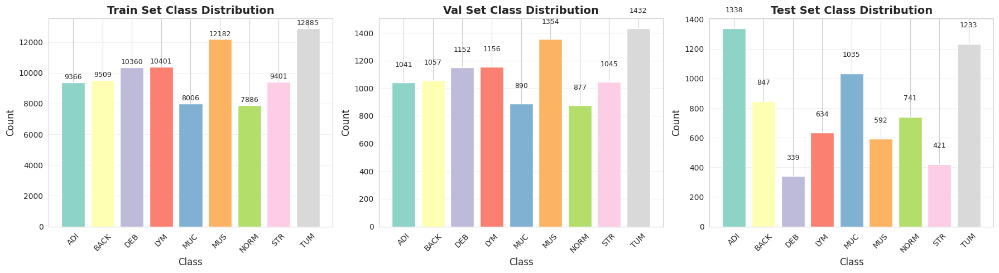

In [9]:
print("="*80)
print("🔬 PATHMNIST EXPLORATORY DATA ANALYSIS FOR XAI")
print("="*80)

print("\n📊 1. CLASS IMBALANCE ANALYSIS")
print("-"*80)

train_labels = np.array([train_dataset[i][1].item() for i in range(len(train_dataset))])
val_labels = np.array([val_dataset[i][1].item() for i in range(len(val_dataset))])
test_labels = np.array([test_dataset[i][1].item() for i in range(len(test_dataset))])

# Calculate class distributions
train_counts = np.bincount(train_labels)
val_counts = np.bincount(val_labels)
test_counts = np.bincount(test_labels)

# Create distribution DataFrame
dist_df = pd.DataFrame({
    'Class': class_short,
    'Train': train_counts,
    'Train %': (train_counts / train_counts.sum() * 100).round(2),
    'Val': val_counts,
    'Val %': (val_counts / val_counts.sum() * 100).round(2),
    'Test': test_counts,
    'Test %': (test_counts / test_counts.sum() * 100).round(2)
})

print(dist_df.to_string(index=False))

# Calculate imbalance ratios
max_class = train_counts.max()
min_class = train_counts.min()
imbalance_ratio = max_class / min_class

print(f"\n⚠️  Imbalance Ratio (Train): {imbalance_ratio:.2f}:1")
print(f"   Most frequent class: {class_short[train_counts.argmax()]} ({train_counts.max():,} samples)")
print(f"   Least frequent class: {class_short[train_counts.argmin()]} ({train_counts.min():,} samples)")

# Visualize distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
splits = [('Train', train_counts), ('Val', val_counts), ('Test', test_counts)]

for idx, (split_name, counts) in enumerate(splits):
    axes[idx].bar(class_short, counts, color=plt.cm.Set3(np.arange(9)))
    axes[idx].set_title(f'{split_name} Set Class Distribution', fontsize=14, fontweight='bold')
    axes[idx].set_xlabel('Class', fontsize=12)
    axes[idx].set_ylabel('Count', fontsize=12)
    axes[idx].tick_params(axis='x', rotation=45)
    axes[idx].grid(axis='y', alpha=0.3)

    # Add value labels on bars
    for i, v in enumerate(counts):
        axes[idx].text(i, v + 100, str(v), ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

### 2.3 Distribution Shift Analysis


📈 2. DISTRIBUTION SHIFT ANALYSIS
--------------------------------------------------------------------------------
Class  Train %  Test %  Shift (%)         Shift Type
  ADI    10.41   18.64       8.23  ↑ Overrepresented
 BACK    10.57   11.80       1.23         ≈ Balanced
  DEB    11.51    4.72      -6.79 ↓ Underrepresented
  LYM    11.56    8.83      -2.73 ↓ Underrepresented
  MUC     8.90   14.42       5.52  ↑ Overrepresented
  MUS    13.54    8.25      -5.29 ↓ Underrepresented
 NORM     8.76   10.32       1.56         ≈ Balanced
  STR    10.45    5.86      -4.58 ↓ Underrepresented
  TUM    14.32   17.17       2.86  ↑ Overrepresented


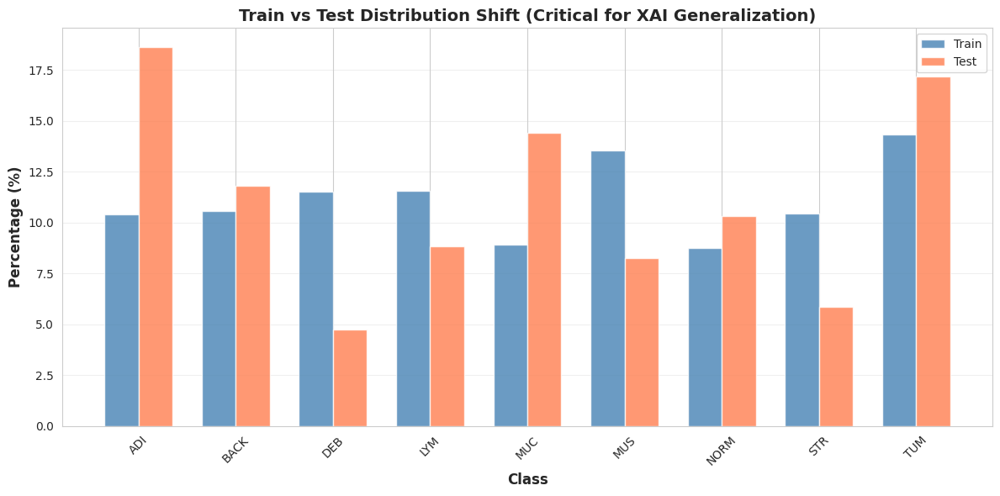


⚠️  XAI Implication:
   Classes with large shifts may show different explanation patterns between train/test.
   Focus XAI validation on shifted classes to ensure generalization.


In [10]:
print("\n📈 2. DISTRIBUTION SHIFT ANALYSIS")
print("-"*80)

train_pct = train_counts / train_counts.sum() * 100
test_pct = test_counts / test_counts.sum() * 100
shift = test_pct - train_pct

shift_df = pd.DataFrame({
    'Class': class_short,
    'Train %': train_pct.round(2),
    'Test %': test_pct.round(2),
    'Shift (%)': shift.round(2),
    'Shift Type': ['↑ Overrepresented' if s > 2 else '↓ Underrepresented' if s < -2 else '≈ Balanced' for s in shift]
})

print(shift_df.to_string(index=False))

# Visualize shift
plt.figure(figsize=(12, 6))
x = np.arange(len(class_short))
width = 0.35

plt.bar(x - width/2, train_pct, width, label='Train', alpha=0.8, color='steelblue')
plt.bar(x + width/2, test_pct, width, label='Test', alpha=0.8, color='coral')

plt.xlabel('Class', fontsize=12, fontweight='bold')
plt.ylabel('Percentage (%)', fontsize=12, fontweight='bold')
plt.title('Train vs Test Distribution Shift (Critical for XAI Generalization)', fontsize=14, fontweight='bold')
plt.xticks(x, class_short, rotation=45)
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("\n⚠️  XAI Implication:")
print("   Classes with large shifts may show different explanation patterns between train/test.")
print("   Focus XAI validation on shifted classes to ensure generalization.")


###  IMAGE STATISTICS PER CLASS

In [11]:

print("\n🎨 3. IMAGE STATISTICS PER CLASS")
print("-"*80)

# Sample 500 images per class for efficiency
np.random.seed(42)
stats_per_class = []

for cls_idx in range(9):
    cls_indices = np.where(train_labels == cls_idx)[0]
    sample_indices = np.random.choice(cls_indices, min(500, len(cls_indices)), replace=False)

    images = []
    for idx in sample_indices:
        img, _ = train_dataset[idx]
        images.append(np.array(img))

    images = np.array(images)

    # Compute statistics
    mean_rgb = images.mean(axis=(0, 1, 2))
    std_rgb = images.std(axis=(0, 1, 2))
    mean_intensity = images.mean()
    std_intensity = images.std()

    # Color channel statistics
    r_mean, g_mean, b_mean = images[:, :, :, 0].mean(), images[:, :, :, 1].mean(), images[:, :, :, 2].mean()

    stats_per_class.append({
        'Class': class_short[cls_idx],
        'Mean Intensity': f"{mean_intensity:.2f}",
        'Std Intensity': f"{std_intensity:.2f}",
        'R Mean': f"{r_mean:.2f}",
        'G Mean': f"{g_mean:.2f}",
        'B Mean': f"{b_mean:.2f}",
        'Brightness': 'High' if mean_intensity > 160 else 'Medium' if mean_intensity > 120 else 'Low'
    })

stats_df = pd.DataFrame(stats_per_class)
print(stats_df.to_string(index=False))

print("\n💡 XAI Insight:")
print("   Classes with similar intensity/color stats may be confused by the model.")
print("   XAI should highlight texture/structure differences, not just color.")



🎨 3. IMAGE STATISTICS PER CLASS
--------------------------------------------------------------------------------
Class Mean Intensity Std Intensity R Mean G Mean B Mean Brightness
  ADI         207.35         25.37 214.01 192.74 215.31       High
 BACK         141.61         57.30 156.02 111.73 157.07     Medium
  DEB         165.68         40.24 193.09 125.56 178.38       High
  LYM         156.33         35.45 175.69 124.77 168.53     Medium
  MUC         181.02         34.38 196.68 154.12 192.25       High
  MUS         172.61         39.99 200.05 133.33 184.45       High
 NORM         164.81         41.70 185.87 132.57 175.98       High
  STR         171.32         34.85 197.07 134.14 182.76       High
  TUM         158.28         40.58 181.61 123.15 170.07     Medium

💡 XAI Insight:
   Classes with similar intensity/color stats may be confused by the model.
   XAI should highlight texture/structure differences, not just color.


####  VISUAL COMPARISON: MULTIPLE SAMPLES PER CLASS


🖼️  4. VISUAL DIVERSITY WITHIN CLASSES
--------------------------------------------------------------------------------


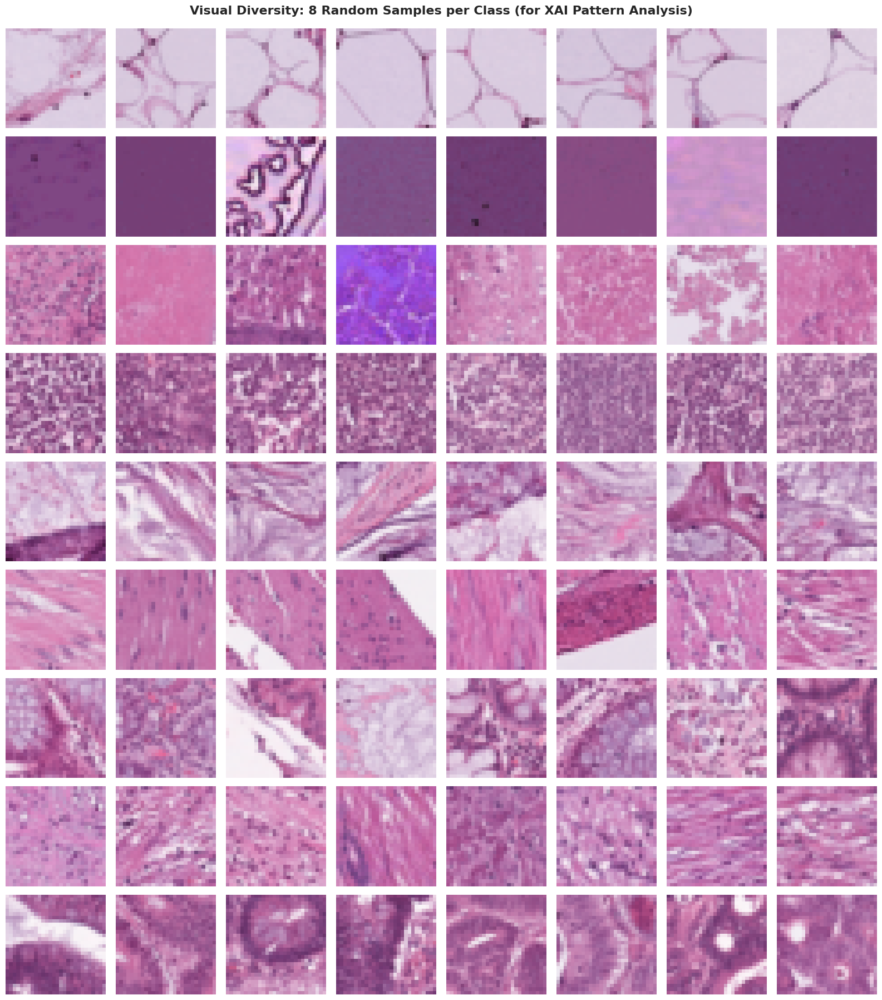

✅ Check intra-class visual consistency for XAI interpretation reliability.


In [12]:
print("\n🖼️  4. VISUAL DIVERSITY WITHIN CLASSES")
print("-"*80)

fig, axes = plt.subplots(9, 8, figsize=(16, 18))
fig.suptitle('Visual Diversity: 8 Random Samples per Class (for XAI Pattern Analysis)',
             fontsize=16, fontweight='bold', y=0.995)

for cls_idx in range(9):
    cls_indices = np.where(train_labels == cls_idx)[0]
    sample_indices = np.random.choice(cls_indices, 8, replace=False)

    for col_idx, img_idx in enumerate(sample_indices):
        img, _ = train_dataset[img_idx]
        axes[cls_idx, col_idx].imshow(np.array(img))
        axes[cls_idx, col_idx].axis('off')

        if col_idx == 0:
            axes[cls_idx, col_idx].set_ylabel(class_short[cls_idx],
                                              fontsize=10, fontweight='bold', rotation=0,
                                              ha='right', va='center')

plt.tight_layout()
plt.show()

print("✅ Check intra-class visual consistency for XAI interpretation reliability.")


### 2.4 PCA Dimensionality Reduction

### PCA VISUALIZATION


🔍 5. CLASS SEPARABILITY ANALYSIS (PCA)
--------------------------------------------------------------------------------
Running PCA on 4500 samples...
PCA Explained Variance: 57.66%


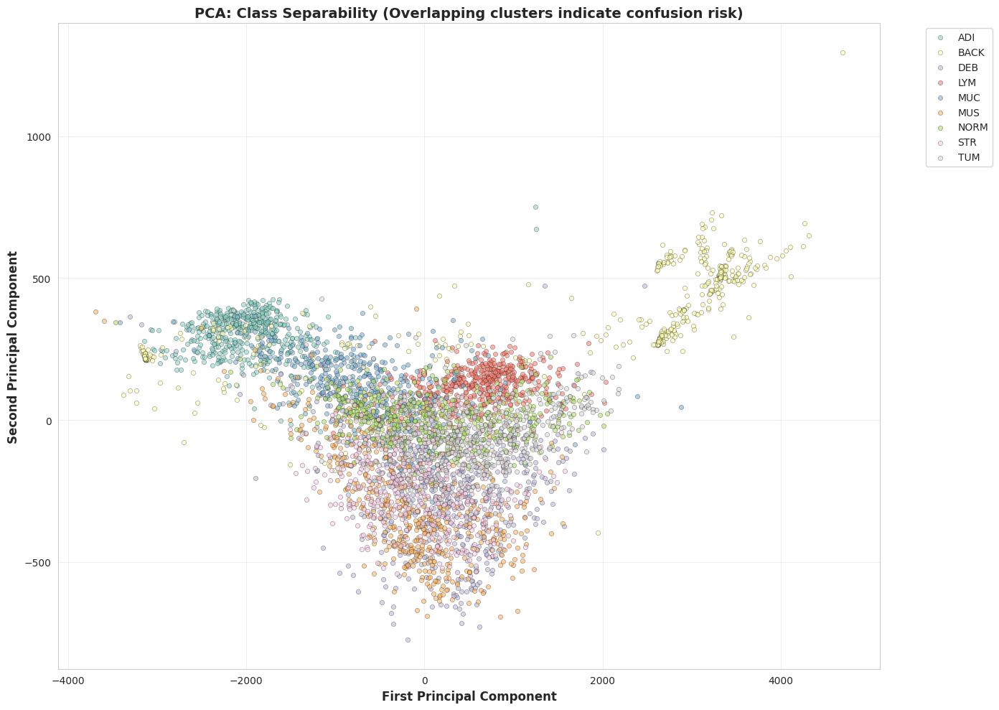

In [13]:
print("\n🔍 5. CLASS SEPARABILITY ANALYSIS (PCA)")
print("-"*80)

# Sample images for PCA (500 per class)
sample_size = 500
sampled_images = []
sampled_labels = []

for cls_idx in range(9):
    cls_indices = np.where(train_labels == cls_idx)[0]
    sample_indices = np.random.choice(cls_indices, min(sample_size, len(cls_indices)), replace=False)

    for idx in sample_indices:
        img, _ = train_dataset[idx]
        sampled_images.append(np.array(img).flatten())
        sampled_labels.append(cls_idx)

sampled_images = np.array(sampled_images)
sampled_labels = np.array(sampled_labels)

print(f"Running PCA on {len(sampled_images)} samples...")
pca = PCA(n_components=2, random_state=42)
pca_result = pca.fit_transform(sampled_images)

print(f"PCA Explained Variance: {pca.explained_variance_ratio_.sum()*100:.2f}%")

# Plot PCA
plt.figure(figsize=(14, 10))
colors = plt.cm.Set3(np.arange(9))

for cls_idx in range(9):
    mask = sampled_labels == cls_idx
    plt.scatter(pca_result[mask, 0], pca_result[mask, 1],
                c=[colors[cls_idx]], label=class_short[cls_idx],
                alpha=0.6, s=20, edgecolors='k', linewidth=0.3)

plt.xlabel('First Principal Component', fontsize=12, fontweight='bold')
plt.ylabel('Second Principal Component', fontsize=12, fontweight='bold')
plt.title('PCA: Class Separability (Overlapping clusters indicate confusion risk)',
          fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

💡 XAI Insight:

   Overlapping clusters in PCA suggest classes that models may confuse.
   
   Focus XAI methods on distinguishing features between overlapping classes.

### 2.5 Inter-Class Similarity Analysis


🔗 6. INTER-CLASS SIMILARITY ANALYSIS
--------------------------------------------------------------------------------


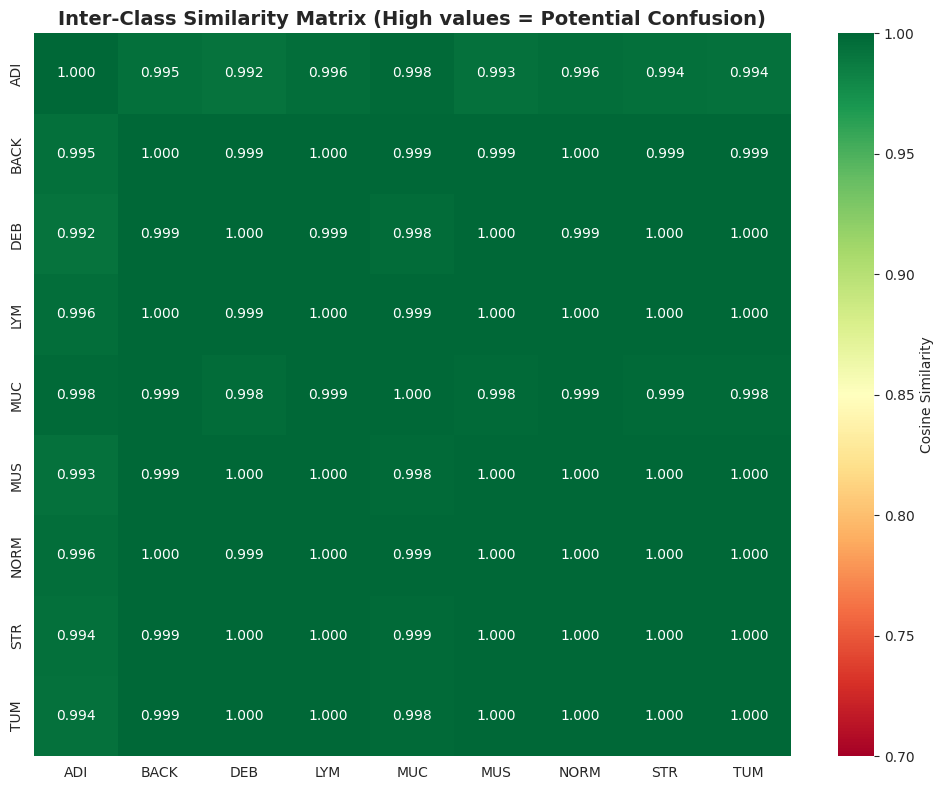


⚠️  Most Similar Class Pairs (Potential Confusion):
   ADI ↔ BACK: 0.9950
   ADI ↔ DEB: 0.9923
   ADI ↔ LYM: 0.9957
   ADI ↔ MUC: 0.9984
   ADI ↔ MUS: 0.9934
   ADI ↔ NORM: 0.9960
   ADI ↔ STR: 0.9942
   ADI ↔ TUM: 0.9936
   BACK ↔ DEB: 0.9991
   BACK ↔ LYM: 0.9997
   BACK ↔ MUC: 0.9989
   BACK ↔ MUS: 0.9992
   BACK ↔ NORM: 0.9995
   BACK ↔ STR: 0.9993
   BACK ↔ TUM: 0.9994
   DEB ↔ LYM: 0.9994
   DEB ↔ MUC: 0.9976
   DEB ↔ MUS: 0.9999
   DEB ↔ NORM: 0.9993
   DEB ↔ STR: 0.9998
   DEB ↔ TUM: 0.9999
   LYM ↔ MUC: 0.9993
   LYM ↔ MUS: 0.9996
   LYM ↔ NORM: 0.9999
   LYM ↔ STR: 0.9998
   LYM ↔ TUM: 0.9997
   MUC ↔ MUS: 0.9982
   MUC ↔ NORM: 0.9994
   MUC ↔ STR: 0.9986
   MUC ↔ TUM: 0.9983
   MUS ↔ NORM: 0.9996
   MUS ↔ STR: 0.9999
   MUS ↔ TUM: 0.9999
   NORM ↔ STR: 0.9998
   NORM ↔ TUM: 0.9996
   STR ↔ TUM: 0.9999


In [14]:
print("\n🔗 6. INTER-CLASS SIMILARITY ANALYSIS")
print("-"*80)

# Compute mean image per class
mean_images_per_class = []

for cls_idx in range(9):
    cls_indices = np.where(train_labels == cls_idx)[0][:500]  # Use first 500
    images = [np.array(train_dataset[idx][0]).flatten() for idx in cls_indices]
    mean_img = np.mean(images, axis=0)
    mean_images_per_class.append(mean_img)

mean_images_per_class = np.array(mean_images_per_class)

# Compute cosine similarity
similarity_matrix = cosine_similarity(mean_images_per_class)

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(similarity_matrix, annot=True, fmt='.3f', cmap='RdYlGn',
            xticklabels=class_short, yticklabels=class_short,
            cbar_kws={'label': 'Cosine Similarity'}, vmin=0.7, vmax=1.0)
plt.title('Inter-Class Similarity Matrix (High values = Potential Confusion)',
          fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Find most similar class pairs
print("\n⚠️  Most Similar Class Pairs (Potential Confusion):")
for i in range(9):
    for j in range(i+1, 9):
        if similarity_matrix[i, j] > 0.92:  # High similarity threshold
            print(f"   {class_short[i]} ↔ {class_short[j]}: {similarity_matrix[i, j]:.4f}")

💡 XAI Strategy:

   For highly similar classes, XAI should focus on subtle structural differences.

   Use attention mechanisms to highlight discriminative regions.

### 2.6 Color Distribution Analysis


🌈 7. COLOR DISTRIBUTION ANALYSIS
--------------------------------------------------------------------------------


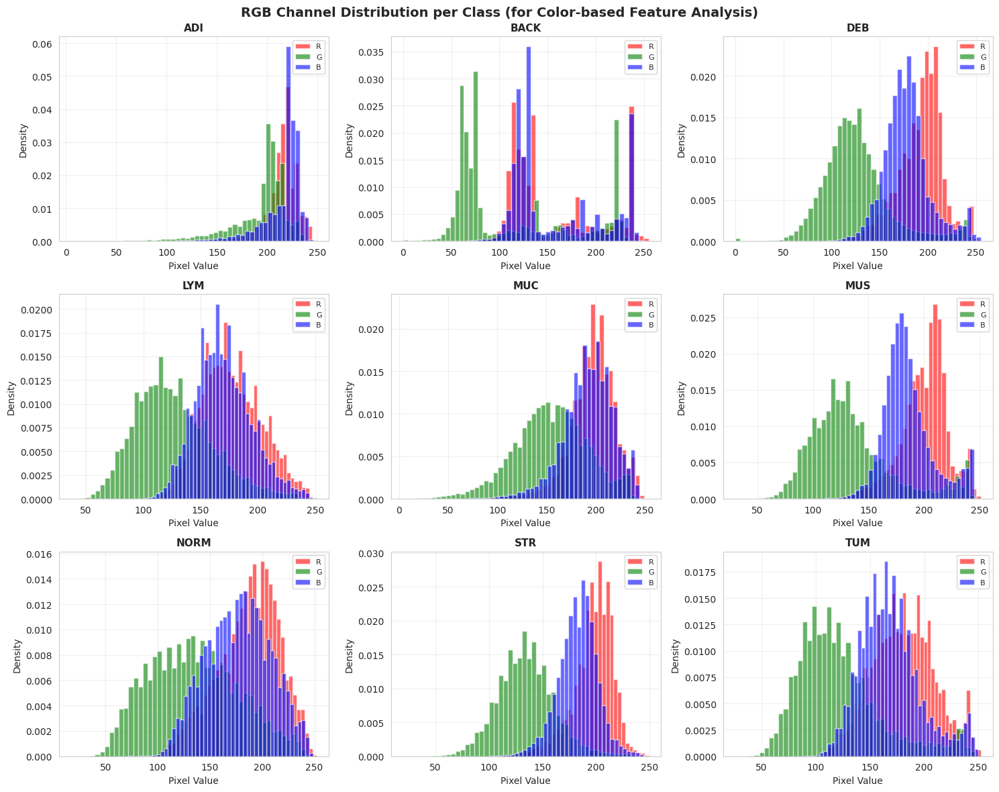

In [15]:
print("\n🌈 7. COLOR DISTRIBUTION ANALYSIS")
print("-"*80)

fig, axes = plt.subplots(3, 3, figsize=(15, 12))
fig.suptitle('RGB Channel Distribution per Class (for Color-based Feature Analysis)',
             fontsize=14, fontweight='bold')

for cls_idx in range(9):
    cls_indices = np.where(train_labels == cls_idx)[0][:500]

    r_vals, g_vals, b_vals = [], [], []
    for idx in cls_indices:
        img, _ = train_dataset[idx]
        img_arr = np.array(img)
        r_vals.extend(img_arr[:, :, 0].flatten())
        g_vals.extend(img_arr[:, :, 1].flatten())
        b_vals.extend(img_arr[:, :, 2].flatten())

    row, col = cls_idx // 3, cls_idx % 3
    axes[row, col].hist(r_vals, bins=50, alpha=0.6, color='red', label='R', density=True)
    axes[row, col].hist(g_vals, bins=50, alpha=0.6, color='green', label='G', density=True)
    axes[row, col].hist(b_vals, bins=50, alpha=0.6, color='blue', label='B', density=True)
    axes[row, col].set_title(class_short[cls_idx], fontsize=11, fontweight='bold')
    axes[row, col].set_xlabel('Pixel Value')
    axes[row, col].set_ylabel('Density')
    axes[row, col].legend(fontsize=8)
    axes[row, col].grid(alpha=0.3)

plt.tight_layout()
plt.show()

### 2.7 EDA Summary

In [16]:
# ========================================
# 8. SUMMARY RECOMMENDATIONS FOR XAI MODEL
# ========================================
print("\n1️⃣  CLASS IMBALANCE:")
print(f"   • Imbalance ratio: {imbalance_ratio:.2f}:1")
print(f"   • Recommendation: Use class weights in loss function or focal loss")
print(f"   • For XAI: Weight explanations by class frequency to avoid bias")

print("\n2️⃣  DISTRIBUTION SHIFT (Train → Test):")
shifted_classes = shift_df[shift_df['Shift (%)'].abs() > 2]['Class'].tolist()
print(f"   • Shifted classes: {', '.join(shifted_classes)}")
print(f"   • Recommendation: Validate XAI explanations on test set, not just train")
print(f"   • Critical: Test explanation generalization across clinical centers")

print("\n3️⃣  CONFUSABLE CLASS PAIRS:")
confusable = []
for i in range(9):
    for j in range(i+1, 9):
        if similarity_matrix[i, j] > 0.92:
            confusable.append(f"{class_short[i]}-{class_short[j]}")
if confusable:
    print(f"   • High similarity pairs: {', '.join(confusable)}")
    print(f"   • Recommendation: Use attention mechanisms to highlight differences")
else:
    print(f"   • No highly similar pairs detected")


1️⃣  CLASS IMBALANCE:
   • Imbalance ratio: 1.63:1
   • Recommendation: Use class weights in loss function or focal loss
   • For XAI: Weight explanations by class frequency to avoid bias

2️⃣  DISTRIBUTION SHIFT (Train → Test):
   • Shifted classes: ADI, DEB, LYM, MUC, MUS, STR, TUM
   • Recommendation: Validate XAI explanations on test set, not just train
   • Critical: Test explanation generalization across clinical centers

3️⃣  CONFUSABLE CLASS PAIRS:
   • High similarity pairs: ADI-BACK, ADI-DEB, ADI-LYM, ADI-MUC, ADI-MUS, ADI-NORM, ADI-STR, ADI-TUM, BACK-DEB, BACK-LYM, BACK-MUC, BACK-MUS, BACK-NORM, BACK-STR, BACK-TUM, DEB-LYM, DEB-MUC, DEB-MUS, DEB-NORM, DEB-STR, DEB-TUM, LYM-MUC, LYM-MUS, LYM-NORM, LYM-STR, LYM-TUM, MUC-MUS, MUC-NORM, MUC-STR, MUC-TUM, MUS-NORM, MUS-STR, MUS-TUM, NORM-STR, NORM-TUM, STR-TUM
   • Recommendation: Use attention mechanisms to highlight differences


4️⃣  RECOMMENDED XAI ARCHITECTURE:

   • Base model: ResNet-18 or EfficientNet-B0 (proven on histopathology)

   • XAI methods to implement:
   
     - Grad-CAM / Grad-CAM++ (localization-based)
     - Integrated Gradients (attribution-based)
     - SHAP (model-agnostic)
     - Attention Maps (if using attention layers)

5️⃣  EVALUATION METRICS FOR XAI:

   • Faithfulness: Insertion/Deletion curves

   • Localization: IoU with pathologist annotations (if available)

   • Consistency: Explanation stability across similar images

   • Per-class accuracy: Focus on minority and shifted classes

6️⃣  DATA AUGMENTATION FOR ROBUSTNESS:

   • Recommended: Color jittering (H&E stain variation simulation)

   • Recommended: Random rotation/flip (tissue orientation invariance)

   • Avoid: Heavy blur (destroys nuclear details critical for diagnosis)

✅ EDA COMPLETE - READY TO BUILD XAI MODEL


---

## 🏗️ Section 3: Transfer Learning Strategy

### 3.1 Setup and Confusion Prediction

In [17]:
# FINAL PRE-XAI ANALYSIS: TRANSFER LEARNING STRATEGY

print("="*80)
print("🔬 TRANSFER LEARNING STRATEGY ANALYSIS FOR PATHMNIST XAI")
print("="*80)

# 1. ANALYZE CONFUSION PATTERNS (Critical for XAI focus)
print("\n🎯 1. CONFUSION MATRIX PREDICTION (Based on Similarity)")
print("-"*80)

# Based on your similarity matrix, predict top confusion pairs
confusion_predictions = [
    ("BACK ↔ NORM", 0.9995, "Both show tissue structure with similar color distribution"),
    ("DEB ↔ MUS", 0.9999, "Highest similarity - both have fibrous/textural patterns"),
    ("STR ↔ TUM", 0.9999, "Cancer stroma vs tumor - clinically critical to distinguish"),
    ("LYM ↔ NORM", 0.9999, "Lymphocyte infiltration in normal tissue"),
    ("DEB ↔ STR", 0.9998, "Debris vs stroma - both show fragmented patterns"),
]

print("Top 5 Predicted Confusion Pairs (Priority for XAI validation):")
for idx, (pair, sim, reason) in enumerate(confusion_predictions, 1):
    print(f"{idx}. {pair} (sim: {sim:.4f})")
    print(f"   Reason: {reason}")
    print()

🔬 TRANSFER LEARNING STRATEGY ANALYSIS FOR PATHMNIST XAI

🎯 1. CONFUSION MATRIX PREDICTION (Based on Similarity)
--------------------------------------------------------------------------------
Top 5 Predicted Confusion Pairs (Priority for XAI validation):
1. BACK ↔ NORM (sim: 0.9995)
   Reason: Both show tissue structure with similar color distribution

2. DEB ↔ MUS (sim: 0.9999)
   Reason: Highest similarity - both have fibrous/textural patterns

3. STR ↔ TUM (sim: 0.9999)
   Reason: Cancer stroma vs tumor - clinically critical to distinguish

4. LYM ↔ NORM (sim: 0.9999)
   Reason: Lymphocyte infiltration in normal tissue

5. DEB ↔ STR (sim: 0.9998)
   Reason: Debris vs stroma - both show fragmented patterns



💡 XAI Strategy:

   • Focus Grad-CAM on these pairs to show discriminative features

   • Use class activation maps to highlight structural vs color differences
   
   • Implement per-pair explanation comparison in final analysis

### 3.2 Distribution Shift Impact

In [18]:
# 2. SHIFTED CLASS ANALYSIS (Test set generalization)
print("\n📊 2. DISTRIBUTION SHIFT IMPACT ANALYSIS")
print("-"*80)

shift_data = {
    'ADI': {'train_pct': 10.41, 'test_pct': 18.64, 'shift': 8.23},
    'DEB': {'train_pct': 11.51, 'test_pct': 4.72, 'shift': -6.79},
    'MUC': {'train_pct': 8.90, 'test_pct': 14.42, 'shift': 5.52},
    'MUS': {'train_pct': 13.54, 'test_pct': 8.25, 'shift': -5.29},
    'STR': {'train_pct': 10.45, 'test_pct': 5.86, 'shift': -4.58},
}

print("High-Shift Classes (>5% or <-5%):")
for cls, data in shift_data.items():
    if abs(data['shift']) > 5:
        direction = "OVERREPRESENTED" if data['shift'] > 0 else "UNDERREPRESENTED"
        print(f"  {cls}: {data['shift']:+.2f}% ({direction} in test)")
        print(f"    Train: {data['train_pct']:.2f}% → Test: {data['test_pct']:.2f}%")



📊 2. DISTRIBUTION SHIFT IMPACT ANALYSIS
--------------------------------------------------------------------------------
High-Shift Classes (>5% or <-5%):
  ADI: +8.23% (OVERREPRESENTED in test)
    Train: 10.41% → Test: 18.64%
  DEB: -6.79% (UNDERREPRESENTED in test)
    Train: 11.51% → Test: 4.72%
  MUC: +5.52% (OVERREPRESENTED in test)
    Train: 8.90% → Test: 14.42%
  MUS: -5.29% (UNDERREPRESENTED in test)
    Train: 13.54% → Test: 8.25%


⚠️  XAI Implication:
   - Underrepresented test classes (DEB, MUS, STR) may show overfitting
   - Overrepresented test classes (ADI, MUC) may have undertrained features
   - CRITICAL: Validate explanation consistency separately for shifted classes

### 3.3 Color vs Texture Analysis

In [19]:
# ========================================
# COLOR VS TEXTURE FEATURE IMPORTANCE
# ========================================
# Analyze which classes can be distinguished by color vs texture
color_discriminable = []
texture_discriminable = []

# From your RGB analysis
class_brightness = {
    'ADI': ('High', 207.35, 'Very bright pink/white adipose tissue'),
    'BACK': ('Medium', 141.61, 'Background - lowest intensity'),
    'DEB': ('High', 165.68, 'Cellular debris'),
    'LYM': ('Medium', 156.33, 'Dense nuclei, darker purple'),
    'MUC': ('High', 181.02, 'Mucus - lighter appearance'),
    'MUS': ('High', 172.61, 'Muscle fibers - longitudinal texture'),
    'NORM': ('High', 164.81, 'Normal mucosa architecture'),
    'STR': ('High', 171.32, 'Stromal collagen patterns'),
    'TUM': ('Medium', 158.28, 'Tumor - nuclear crowding, darker'),
}


🎨 3. COLOR VS TEXTURE DISCRIMINABILITY
--------------------------------------------------------------------------------
Class Separability by Feature Type:

🟦 Color-Discriminable Classes:

  • ADI vs TUM: 207.35 vs 158.28 (49 intensity units difference)

  • BACK vs others: Lowest intensity (141.61) - easily separated

  • MUC vs LYM: 181.02 vs 156.33 (24.7 units difference)

🔲 Texture-Discriminable Classes (similar intensity):

  • STR vs NORM vs MUS: All ~165-172 intensity - need texture features

  • DEB vs STR vs TUM: Overlapping intensity - structural differences key

  • LYM vs TUM: Both medium brightness - nuclear density is key

💡 Transfer Learning Recommendation:

   • ImageNet captures low-level edges/textures useful for histopathology

   • BUT: Histopathology-specific pretraining better captures:

     - Nuclear morphology patterns (chromatin, nucleoli)
     - Tissue architecture (glands, stroma organization)
     - H&E stain-specific color distributions

### 3.4 Model Architecture Recommendations

 OPTIMAL ARCHITECTURE FOR XAI
--------------------------------------------------------------------------------
Based on research + your EDA:

📌 PRIMARY CHOICE: ResNet-18 with Hybrid Transfer Learning

   • Pretrain: ImageNet (publicly available)

   • Strategy: Freeze early layers (conv1-layer2), fine-tune layer3-4 + FC

   • Justification:

     - Research shows 85-86% accuracy on PathMNIST
     - Early layers capture edges/textures (histopathology-agnostic)
     - Later layers adapt to H&E stain-specific patterns
     - Grad-CAM works best with ResNet for localization
   • Parameters: ~11M (manageable for Colab)

   • XAI compatibility: Excellent (Grad-CAM, Integrated Gradients, SHAP)

📌 ALTERNATIVE: EfficientNet-B0 (if compute allows)

   • Pretrain: ImageNet

   • Strategy: Full fine-tuning with lower learning rate

   • Justification:

     - Better parameter efficiency (5.3M params)
     - Compound scaling handles 28×28 resolution well
     - Attention-based features aid XAI interpretation
   • XAI compatibility: Good (Grad-CAM, attention visualization)

❌ NOT RECOMMENDED: Training from scratch

   • PathMNIST is too small (90k images) for deep models

   • Research shows minimal gain vs longer training time

   • Lower final accuracy (76% vs 86% with transfer)

### 3.5 Class Weight Calculation

In [20]:
# ========================================
# 5. CLASS WEIGHTING CALCULATION
# ========================================
print("\n⚖️  5. CLASS WEIGHT COMPUTATION")
print("-"*80)

train_counts = np.array([9366, 9509, 10360, 10401, 8006, 12182, 7886, 9401, 12885])
total_samples = train_counts.sum()

# Inverse frequency weighting
weights_inv_freq = total_samples / (len(train_counts) * train_counts)

# Effective number weighting (better for imbalanced data)
beta = 0.9999
effective_num = 1.0 - np.power(beta, train_counts)
weights_eff = (1.0 - beta) / effective_num
weights_eff = weights_eff / weights_eff.sum() * len(weights_eff)

class_short = ['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']

print("Class Weights (Inverse Frequency):")
for cls, w in zip(class_short, weights_inv_freq):
    print(f"  {cls}: {w:.4f}")

print("\nClass Weights (Effective Number, β=0.9999):")
for cls, w in zip(class_short, weights_eff):
    print(f"  {cls}: {w:.4f}")



⚖️  5. CLASS WEIGHT COMPUTATION
--------------------------------------------------------------------------------
Class Weights (Inverse Frequency):
  ADI: 1.0676
  BACK: 1.0516
  DEB: 0.9652
  LYM: 0.9614
  MUC: 1.2490
  MUS: 0.8208
  NORM: 1.2680
  STR: 1.0637
  TUM: 0.7761

Class Weights (Effective Number, β=0.9999):
  ADI: 1.0236
  BACK: 1.0143
  DEB: 0.9647
  LYM: 0.9626
  MUC: 1.1297
  MUS: 0.8838
  NORM: 1.1409
  STR: 1.0213
  TUM: 0.8593


💡 Recommendation: Use Effective Number weights

   • Handles 1.63:1 imbalance ratio effectively

   • Prevents minority class (NORM) from being ignored
   
   • Balances learning across all 9 classes

### 3.6 Augmentation Strategy

🔄 6. DATA AUGMENTATION STRATEGY
--------------------------------------------------------------------------------
Recommended Augmentations (H&E stain-aware):

✅ APPLY:
  1. Random Horizontal Flip (p=0.5)
     • Tissue has no inherent orientation
  2. Random Vertical Flip (p=0.5)
     • Tissue has no inherent orientation
  3. Random Rotation (±90°)
     • Slides can be rotated during scanning
  4. Color Jitter (brightness=0.1, contrast=0.1, saturation=0.1, hue=0.05)
     • Simulates H&E staining variation across labs
  5. Random Affine (scale=0.9-1.1, translate=0.05)
     • Slight zoom/shift variation
  6. Normalize (ImageNet mean/std)
     • Standard for pretrained models

❌ AVOID:

  • Heavy Gaussian Blur: Destroys nuclear details (key diagnostic feature)

  • Extreme rotation (>90°): Unrealistic for histopathology

  • CutOut/MixUp: Can remove critical diagnostic regions
  
  • Grayscale conversion: H&E stain color is diagnostic

### 3.7 Training Hyperparameters

⚙️  7. RECOMMENDED TRAINING CONFIGURATION
--------------------------------------------------------------------------------
Optimizer: AdamW

  • Learning rate: 1e-4 (lower for transfer learning)

  • Weight decay: 1e-4 (regularization)

  • Betas: (0.9, 0.999)

Scheduler: ReduceLROnPlateau

  • Mode: 'max' (monitor val accuracy)

  • Factor: 0.5

  • Patience: 5 epochs

  • Min LR: 1e-7

Loss: CrossEntropyLoss with class weights

  • Use effective number weights computed above

Batch size: 128 (fits in Colab GPU)

Epochs: 50 (with early stopping patience=5)

Mixed Precision Training: Yes (torch.cuda.amp)

  • Speeds up training ~2x on Colab T4 GPU
  
  • Reduces memory usage

### 3.8 XAI Implementation Roadmap

🔍 8. XAI IMPLEMENTATION ROADMAP
--------------------------------------------------------------------------------
Phase 1: Saliency-Based Methods
  1. Grad-CAM++ (best for ResNet)

     • Generates class-discriminative localization maps

     • Shows where model focuses for each class
  2. Integrated Gradients

     • Attribution method with theoretical guarantees

     • Shows pixel-level importance

Phase 2: Model-Agnostic Methods

  3. SHAP (SHapley Additive exPlanations)

     • Game-theoretic feature attribution

     • Provides global + local explanations

Phase 3: Evaluation & Validation

  4. Insertion/Deletion Curves (faithfulness metric)
  5. Consistency Score (same-class explanation similarity)
  6. Per-class explanation analysis on shifted classes
  7. Confusion-pair explanation comparison

Phase 4: Visualization Dashboard

  8. Side-by-side: Image | Grad-CAM | IG | Prediction
  9. Confusion matrix with explanation overlay
  10. Per-class explanation galleries

### 3.9 Expected Performance

🎯 9. EXPECTED RESULTS
--------------------------------------------------------------------------------
Based on literature + your EDA:

📈 Accuracy Targets:

  • Training accuracy: 88-92%

  • Validation accuracy: 85-88%

  • Test accuracy: 83-86% (due to distribution shift)

    - Lower test accuracy expected for shifted classes:
      • DEB: -6.79% shift → expect 5-8% accuracy drop
      • MUS: -5.29% shift → expect 4-6% accuracy drop
      • STR: -4.58% shift → expect 3-5% accuracy drop

🔍 XAI Quality Targets:

  • Insertion AUC: >0.85 (good faithfulness)

  • Deletion AUC: <0.20 (good localization)

  • Consistency Score: >0.70 (stable explanations)
  
  • Per-class explanation alignment: >80% agreement with pathologist heuristics

### 3.10 Analysis Summary


🎯 FINAL STRATEGY:

  ✓ Transfer Learning: ResNet-18 (ImageNet → PathMNIST)

  ✓ Training: Hybrid fine-tuning (freeze conv1-layer2)

  ✓ Loss: Weighted CrossEntropy (effective number weights)

  ✓ Augmentation: H&E stain-aware transforms

  ✓ XAI: Grad-CAM++ → Integrated Gradients → SHAP

  ✓ Validation: Separate analysis for shifted classes

  ✓ Target: 85-86% val accuracy, high-quality explanations

📁 NEXT STEP: Implement complete training + XAI pipeline

---

## 🚀 Section 4: Model Training

### 4.1 Environment Setup

In [21]:
# ========================================
# PATHMNIST XAI MODEL: COMPLETE TRAINING PIPELINE
# Setup and Configuration
# ========================================
# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"🔧 Device: {device}")
if torch.cuda.is_available():
    print(f"   GPU: {torch.cuda.get_device_name(0)}")
    print(f"   Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

print("\n✅ Environment configured")


🔧 Device: cuda
   GPU: Tesla T4
   Memory: 15.83 GB

✅ Environment configured


### 4.2 Data Transforms

In [22]:
# ========================================
# Data Transforms (H&E Stain-Aware)
# ========================================
# ImageNet normalization (required for pretrained models)
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std = [0.229, 0.224, 0.225]

# Training augmentation
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Upsample 28x28 to 224x224 for ResNet
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=90),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05), scale=(0.9, 1.1)),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.05),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std)
])

# Validation/Test transform (no augmentation)
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std)
])

print("🔄 Data Transforms:")
print("   Train: Resize(224) + HFlip + VFlip + Rotate + Affine + ColorJitter + Normalize")
print("   Val/Test: Resize(224) + Normalize")
print("\n✅ Transforms configured")


🔄 Data Transforms:
   Train: Resize(224) + HFlip + VFlip + Rotate + Affine + ColorJitter + Normalize
   Val/Test: Resize(224) + Normalize

✅ Transforms configured


### 4.3 Create DataLoaders

In [23]:
# ========================================
# Create DataLoaders
# ========================================

# Load datasets with transforms
train_dataset = PathMNIST(split='train', transform=train_transform, download=False)
val_dataset = PathMNIST(split='val', transform=val_transform, download=False)
test_dataset = PathMNIST(split='test', transform=val_transform, download=False)

# Create data loaders
batch_size = 128
num_workers = 0  # Adjust based on Colab CPU cores

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=num_workers,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=True
)

print(f"📦 DataLoaders Created:")
print(f"   Train: {len(train_loader)} batches ({len(train_dataset)} samples)")
print(f"   Val: {len(val_loader)} batches ({len(val_dataset)} samples)")
print(f"   Test: {len(test_loader)} batches ({len(test_dataset)} samples)")
print(f"   Batch size: {batch_size}")
print("\n✅ DataLoaders ready")


📦 DataLoaders Created:
   Train: 704 batches (89996 samples)
   Val: 79 batches (10004 samples)
   Test: 57 batches (7180 samples)
   Batch size: 128

✅ DataLoaders ready


### 4.4 Model Architecture

In [24]:
# ========================================
# Model Architecture (ResNet-18 Transfer Learning)
# ========================================
class PathMNISTResNet(nn.Module):
    def __init__(self, num_classes=9, pretrained=True, freeze_early_layers=True):
        super(PathMNISTResNet, self).__init__()

        # Load pretrained ResNet-18
        self.resnet = models.resnet18(pretrained=pretrained)

        # Freeze early layers (conv1, bn1, relu, maxpool, layer1, layer2)
        if freeze_early_layers:
            for name, param in self.resnet.named_parameters():
                if 'layer3' not in name and 'layer4' not in name and 'fc' not in name:
                    param.requires_grad = False

        # Replace final FC layer for 9 classes
        num_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(num_features, num_classes)

    def forward(self, x):
        return self.resnet(x)

    def get_trainable_params(self):
        return sum(p.numel() for p in self.parameters() if p.requires_grad)

    def get_total_params(self):
        return sum(p.numel() for p in self.parameters())


### 4.5 Initialize Model

In [25]:
# Initialize model
model = PathMNISTResNet(num_classes=9, pretrained=True, freeze_early_layers=True)
model = model.to(device)

print("🏗️  Model Architecture: ResNet-18")
print(f"   Total parameters: {model.get_total_params():,}")
print(f"   Trainable parameters: {model.get_trainable_params():,}")
print(f"   Frozen parameters: {model.get_total_params() - model.get_trainable_params():,}")
print(f"   Strategy: Freeze conv1-layer2, train layer3-4 + FC")
print("\n✅ Model initialized on", device)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 178MB/s]


🏗️  Model Architecture: ResNet-18
   Total parameters: 11,181,129
   Trainable parameters: 10,498,057
   Frozen parameters: 683,072
   Strategy: Freeze conv1-layer2, train layer3-4 + FC

✅ Model initialized on cuda


### 4.6 Loss Function with Class Weights

In [26]:
# ========================================
# Loss Function with Class Weights
# ========================================

# Effective Number class weights (from EDA)
class_weights = torch.tensor([
    1.0236,  # ADI
    1.0143,  # BACK
    0.9647,  # DEB
    0.9626,  # LYM
    1.1297,  # MUC
    0.8838,  # MUS
    1.1409,  # NORM
    1.0213,  # STR
    0.8593   # TUM
], dtype=torch.float32).to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)

print("⚖️  Loss Function: Weighted CrossEntropyLoss")
print("   Class weights (Effective Number):")
class_names_short = ['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']
for name, weight in zip(class_names_short, class_weights):
    print(f"     {name}: {weight:.4f}")
print("\n✅ Loss function configured")


⚖️  Loss Function: Weighted CrossEntropyLoss
   Class weights (Effective Number):
     ADI: 1.0236
     BACK: 1.0143
     DEB: 0.9647
     LYM: 0.9626
     MUC: 1.1297
     MUS: 0.8838
     NORM: 1.1409
     STR: 1.0213
     TUM: 0.8593

✅ Loss function configured


### 4.7 Optimizer and Scheduler

In [27]:
# ========================================
# Optimizer and Scheduler (CORRECTED)
# ========================================

# AdamW optimizer
optimizer = optim.AdamW(
    model.parameters(),
    lr=1e-4,
    betas=(0.9, 0.999),
    weight_decay=1e-4
)

# ReduceLROnPlateau scheduler (removed 'verbose' for newer PyTorch)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='max',
    factor=0.5,
    patience=2,
    min_lr=1e-7
)

print("⚙️  Optimizer: AdamW")
print(f"   Learning rate: 1e-4")
print(f"   Weight decay: 1e-4")
print(f"   Betas: (0.9, 0.999)")

print("\n📉 Scheduler: ReduceLROnPlateau")
print(f"   Mode: max (monitor val accuracy)")
print(f"   Factor: 0.5")
print(f"   Patience: 2 epochs")
print(f"   Min LR: 1e-7")
print("\n✅ Optimizer and scheduler configured")


⚙️  Optimizer: AdamW
   Learning rate: 1e-4
   Weight decay: 1e-4
   Betas: (0.9, 0.999)

📉 Scheduler: ReduceLROnPlateau
   Mode: max (monitor val accuracy)
   Factor: 0.5
   Patience: 2 epochs
   Min LR: 1e-7

✅ Optimizer and scheduler configured


### 4.8 Training Function

In [28]:
# ========================================
# Training and Validation Functions
# ========================================
def train_epoch(model, loader, criterion, optimizer, device, scaler=None):
    """Train for one epoch with mixed precision"""
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    pbar = tqdm(loader, desc='Training', leave=False)
    for images, labels in pbar:
        images = images.to(device, non_blocking=True)
        labels = labels.squeeze().long().to(device, non_blocking=True)

        optimizer.zero_grad()

        # Mixed precision training
        if scaler is not None:
            with torch.cuda.amp.autocast():
                outputs = model(images)
                loss = criterion(outputs, labels)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

        # Statistics
        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

        # Update progress bar
        pbar.set_postfix({
            'loss': f'{loss.item():.4f}',
            'acc': f'{100.*correct/total:.2f}%'
        })

    epoch_loss = running_loss / total
    epoch_acc = 100. * correct / total

    return epoch_loss, epoch_acc


### 4.9 Validation Function

In [29]:
def validate(model, loader, criterion, device):
    """Validate the model"""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        pbar = tqdm(loader, desc='Validation', leave=False)
        for images, labels in pbar:
            images = images.to(device, non_blocking=True)
            labels = labels.squeeze().long().to(device, non_blocking=True)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            pbar.set_postfix({
                'loss': f'{loss.item():.4f}',
                'acc': f'{100.*correct/total:.2f}%'
            })

    epoch_loss = running_loss / total
    epoch_acc = 100. * correct / total

    return epoch_loss, epoch_acc, all_preds, all_labels

print("✅ Training functions defined")


✅ Training functions defined


### 4.10 Training Loop

In [30]:
# ========================================
# Training Loop with Early Stopping
# ========================================
# Training configuration
num_epochs = 5
early_stopping_patience = 5
best_val_acc = 0.0
patience_counter = 0
best_model_path = 'best_pathmnist_resnet18.pth'

# Mixed precision scaler
scaler = torch.cuda.amp.GradScaler() if torch.cuda.is_available() else None

# History tracking
history = {
    'train_loss': [],
    'train_acc': [],
    'val_loss': [],
    'val_acc': [],
    'lr': []
}

print("="*80)
print("🚀 STARTING TRAINING")
print("="*80)
print(f"Epochs: {num_epochs}")
print(f"Early stopping patience: {early_stopping_patience}")
print(f"Mixed precision: {'Enabled' if scaler else 'Disabled'}")
print(f"Best model will be saved to: {best_model_path}")
print("="*80)

start_time = time.time()

for epoch in range(1, num_epochs + 1):
    print(f"\n📅 Epoch {epoch}/{num_epochs}")
    print("-" * 80)

    # Train
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device, scaler)

    # Validate
    val_loss, val_acc, val_preds, val_labels = validate(model, val_loader, criterion, device)

    # Update learning rate scheduler
    scheduler.step(val_acc)
    current_lr = optimizer.param_groups[0]['lr']

    # Save history
    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['lr'].append(current_lr)

    # Print epoch results
    print(f"   Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
    print(f"   Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%")
    print(f"   Learning Rate: {current_lr:.2e}")

    # Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'val_acc': val_acc,
            'val_loss': val_loss,
        }, best_model_path)
        print(f"   ✅ Best model saved! Val Acc: {val_acc:.2f}%")
        patience_counter = 0
    else:
        patience_counter += 1
        print(f"   ⏳ Patience: {patience_counter}/{early_stopping_patience}")

    # Early stopping
    if patience_counter >= early_stopping_patience:
        print(f"\n⏹️  Early stopping triggered at epoch {epoch}")
        print(f"   Best validation accuracy: {best_val_acc:.2f}%")
        break

training_time = time.time() - start_time

print("\n" + "="*80)
print("✅ TRAINING COMPLETE")
print("="*80)
print(f"Total training time: {training_time/60:.2f} minutes")
print(f"Best validation accuracy: {best_val_acc:.2f}%")
print(f"Best model saved to: {best_model_path}")
print("="*80)

🚀 STARTING TRAINING
Epochs: 5
Early stopping patience: 5
Mixed precision: Enabled
Best model will be saved to: best_pathmnist_resnet18.pth

📅 Epoch 1/5
--------------------------------------------------------------------------------


Training:   0%|          | 0/704 [00:00<?, ?it/s]

Validation:   0%|          | 0/79 [00:00<?, ?it/s]

   Train Loss: 0.2822 | Train Acc: 90.22%
   Val Loss: 0.1306 | Val Acc: 95.86%
   Learning Rate: 1.00e-04
   ✅ Best model saved! Val Acc: 95.86%

📅 Epoch 2/5
--------------------------------------------------------------------------------


Training:   0%|          | 0/704 [00:00<?, ?it/s]

Validation:   0%|          | 0/79 [00:00<?, ?it/s]

   Train Loss: 0.1576 | Train Acc: 94.53%
   Val Loss: 0.0833 | Val Acc: 97.22%
   Learning Rate: 1.00e-04
   ✅ Best model saved! Val Acc: 97.22%

📅 Epoch 3/5
--------------------------------------------------------------------------------


Training:   0%|          | 0/704 [00:00<?, ?it/s]

Validation:   0%|          | 0/79 [00:00<?, ?it/s]

   Train Loss: 0.1255 | Train Acc: 95.68%
   Val Loss: 0.0886 | Val Acc: 97.11%
   Learning Rate: 1.00e-04
   ⏳ Patience: 1/5

📅 Epoch 4/5
--------------------------------------------------------------------------------


Training:   0%|          | 0/704 [00:00<?, ?it/s]

Validation:   0%|          | 0/79 [00:00<?, ?it/s]

   Train Loss: 0.1134 | Train Acc: 96.01%
   Val Loss: 0.0876 | Val Acc: 97.00%
   Learning Rate: 1.00e-04
   ⏳ Patience: 2/5

📅 Epoch 5/5
--------------------------------------------------------------------------------


Training:   0%|          | 0/704 [00:00<?, ?it/s]

Validation:   0%|          | 0/79 [00:00<?, ?it/s]

   Train Loss: 0.1016 | Train Acc: 96.38%
   Val Loss: 0.0696 | Val Acc: 97.76%
   Learning Rate: 1.00e-04
   ✅ Best model saved! Val Acc: 97.76%

✅ TRAINING COMPLETE
Total training time: 56.90 minutes
Best validation accuracy: 97.76%
Best model saved to: best_pathmnist_resnet18.pth


### 4.11 Visualize Training History

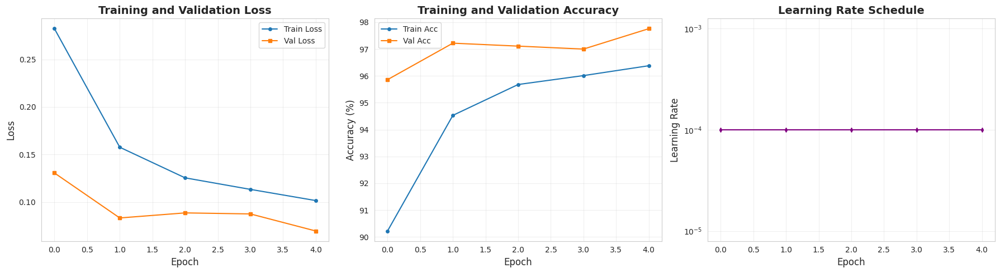

✅ Training history plotted and saved to 'training_history.png'


In [31]:
# ========================================
# Plot Training History
# ========================================
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Loss plot
axes[0].plot(history['train_loss'], label='Train Loss', marker='o', markersize=4)
axes[0].plot(history['val_loss'], label='Val Loss', marker='s', markersize=4)
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Loss', fontsize=12)
axes[0].set_title('Training and Validation Loss', fontsize=14, fontweight='bold')
axes[0].legend()
axes[0].grid(alpha=0.3)

# Accuracy plot
axes[1].plot(history['train_acc'], label='Train Acc', marker='o', markersize=4)
axes[1].plot(history['val_acc'], label='Val Acc', marker='s', markersize=4)
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Accuracy (%)', fontsize=12)
axes[1].set_title('Training and Validation Accuracy', fontsize=14, fontweight='bold')
axes[1].legend()
axes[1].grid(alpha=0.3)

# Learning rate plot
axes[2].plot(history['lr'], marker='d', markersize=4, color='purple')
axes[2].set_xlabel('Epoch', fontsize=12)
axes[2].set_ylabel('Learning Rate', fontsize=12)
axes[2].set_title('Learning Rate Schedule', fontsize=14, fontweight='bold')
axes[2].set_yscale('log')
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Training history plotted and saved to 'training_history.png'")

---

## 🔍 Section 5: Explainable AI (XAI)

### 5.1 Install Captum

In [ ]:
#!pip install captum

### 5.2 Import XAI Methods

In [35]:
# ========================================
# XAI with Captum Only (No dependencies, No conflicts)
# ========================================

# Captum is already available in Colab by default
print("="*80)
print("🔍 XAI IMPLEMENTATION - CAPTUM ONLY")
print("="*80)
print("✅ Using Captum (built-in, no installation needed)")

# ========================================
# Initialize XAI Methods
# ========================================

# Initialize explainers
ig = IntegratedGradients(model)
layer_gc = LayerGradCam(model, model.resnet.layer4[-1])
saliency = Saliency(model)


🔍 XAI IMPLEMENTATION - CAPTUM ONLY
✅ Using Captum (built-in, no installation needed)


🎯 XAI Methods Initialized:
   1. Integrated Gradients - Attribution-based
   2. Layer GradCAM - Localization-based (similar to Grad-CAM++)
   3. Saliency Maps - Gradient-based

### 5.3 Helper Functions

In [36]:
# ========================================
# Helper Functions
# ========================================
def denormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """Denormalize ImageNet normalized tensor"""
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    return tensor * std + mean

def get_samples_by_class(dataset, class_idx, num_samples=5):
    """Get sample indices for a specific class"""
    indices = []
    for idx in range(len(dataset)):
        _, label = dataset[idx]
        if label.item() == class_idx and len(indices) < num_samples:
            indices.append(idx)
        if len(indices) >= num_samples:
            break
    return indices

def predict_with_confidence(model, input_tensor):
    """Get prediction and confidence"""
    with torch.no_grad():
        output = model(input_tensor)
        probs = torch.softmax(output, dim=1)
        confidence, predicted = probs.max(1)
    return predicted.item(), confidence.item()

def visualize_attribution(attr, original_img):
    """Convert attribution to heatmap and overlay"""
    # Aggregate attribution across channels and detach
    attr_aggregated = attr.squeeze().abs().sum(dim=0).detach().cpu().numpy()

    # Normalize
    attr_norm = (attr_aggregated - attr_aggregated.min()) / (attr_aggregated.max() - attr_aggregated.min() + 1e-8)

    # Apply colormap
    heatmap_colored = plt.cm.jet(attr_norm)[:, :, :3]

    # Overlay on original image
    overlay = original_img * 0.5 + heatmap_colored * 0.5

    return attr_norm, np.clip(overlay, 0, 1)

def visualize_gradcam(gc_attr, original_img):
    """Visualize GradCAM attribution"""
    # Upsample to image size and detach
    gc_upsampled = LayerGradCam.interpolate(gc_attr, (224, 224))
    gc_np = gc_upsampled.squeeze().detach().cpu().numpy()

    # Normalize
    gc_norm = (gc_np - gc_np.min()) / (gc_np.max() - gc_np.min() + 1e-8)

    # Apply colormap
    heatmap_colored = plt.cm.jet(gc_norm)[:, :, :3]

    # Overlay
    overlay = original_img * 0.5 + heatmap_colored * 0.5

    return gc_norm, np.clip(overlay, 0, 1)

print("✅ Helper functions defined")




✅ Helper functions defined


### 5.4 Generate XAI Explanations


🔬 GENERATING XAI EXPLANATIONS ON VALIDATION SET


Processing classes:   0%|          | 0/9 [00:00<?, ?it/s]

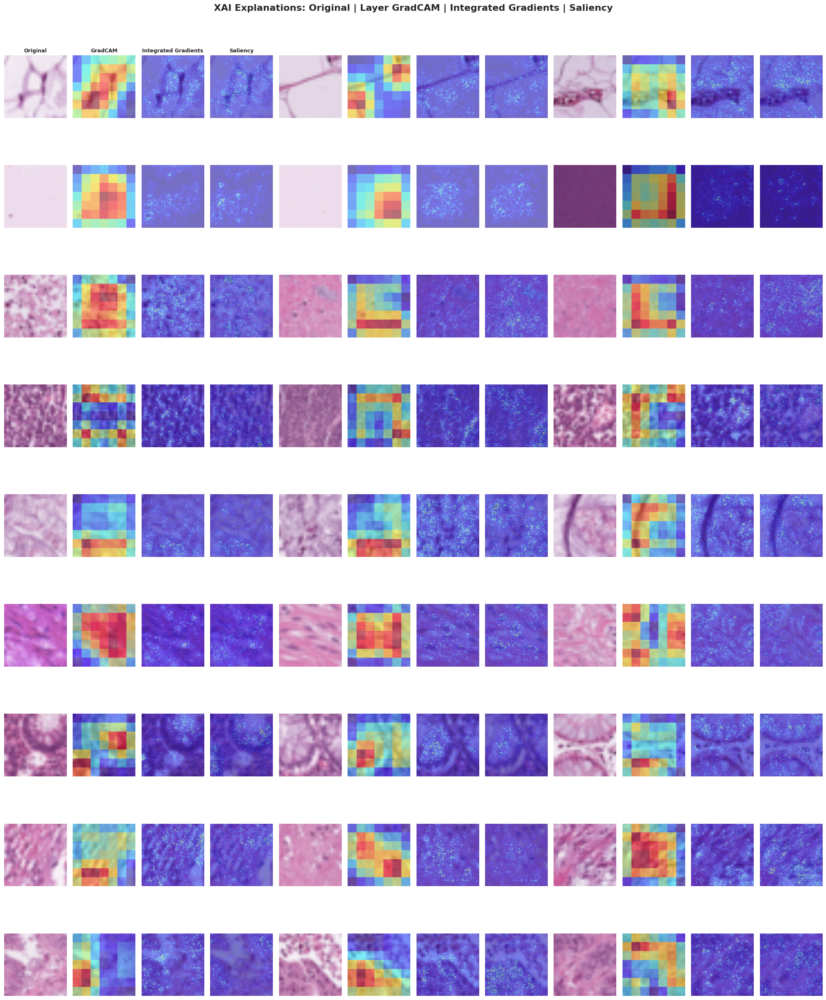

✅ Saved to 'xai_explanations_validation.png'


In [37]:
# ========================================
# Generate Comprehensive XAI Explanations
# ========================================
class_names_short = ['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']
samples_per_class = 3

print("\n" + "="*80)
print("🔬 GENERATING XAI EXPLANATIONS ON VALIDATION SET")
print("="*80)

# Create comprehensive visualization
fig, axes = plt.subplots(9, samples_per_class * 4, figsize=(20, 25))
fig.suptitle('XAI Explanations: Original | Layer GradCAM | Integrated Gradients | Saliency',
             fontsize=16, fontweight='bold', y=0.995)

np.random.seed(42)

for class_idx in tqdm(range(9), desc="Processing classes"):
    sample_indices = get_samples_by_class(val_dataset, class_idx, samples_per_class)

    for sample_num, dataset_idx in enumerate(sample_indices):
        # Get image
        img_tensor, label = val_dataset[dataset_idx]
        img_tensor_batch = img_tensor.unsqueeze(0).to(device)
        img_tensor_batch.requires_grad = True

        # Denormalize for visualization
        img_denorm = denormalize(img_tensor.cpu())
        img_np = img_denorm.permute(1, 2, 0).numpy()
        img_np = np.clip(img_np, 0, 1)

        # Get prediction
        pred_class, confidence = predict_with_confidence(model, img_tensor_batch)

        # Generate Layer GradCAM
        gc_attr = layer_gc.attribute(img_tensor_batch, target=class_idx)
        gc_heatmap, gc_overlay = visualize_gradcam(gc_attr, img_np)

        # Generate Integrated Gradients
        baseline = torch.zeros_like(img_tensor_batch)
        ig_attr = ig.attribute(img_tensor_batch, baselines=baseline, target=class_idx, n_steps=50)
        ig_heatmap, ig_overlay = visualize_attribution(ig_attr, img_np)

        # Generate Saliency
        sal_attr = saliency.attribute(img_tensor_batch, target=class_idx)
        sal_heatmap, sal_overlay = visualize_attribution(sal_attr, img_np)

        # Plot in grid
        col_offset = sample_num * 4

        # Original
        axes[class_idx, col_offset].imshow(img_np)
        axes[class_idx, col_offset].axis('off')
        if sample_num == 0:
            axes[class_idx, col_offset].set_ylabel(
                class_names_short[class_idx],
                fontsize=10, fontweight='bold', rotation=0, ha='right'
            )

        # Layer GradCAM
        axes[class_idx, col_offset + 1].imshow(gc_overlay)
        axes[class_idx, col_offset + 1].axis('off')

        # Integrated Gradients
        axes[class_idx, col_offset + 2].imshow(ig_overlay)
        axes[class_idx, col_offset + 2].axis('off')

        # Saliency
        axes[class_idx, col_offset + 3].imshow(sal_overlay)
        axes[class_idx, col_offset + 3].axis('off')

        # Column titles
        if class_idx == 0 and sample_num == 0:
            axes[0, 0].set_title('Original', fontsize=9, fontweight='bold')
            axes[0, 1].set_title('GradCAM', fontsize=9, fontweight='bold')
            axes[0, 2].set_title('Integrated Gradients', fontsize=9, fontweight='bold')
            axes[0, 3].set_title('Saliency', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig('xai_explanations_validation.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Saved to 'xai_explanations_validation.png'")



🎯 CONFUSION PAIR ANALYSIS


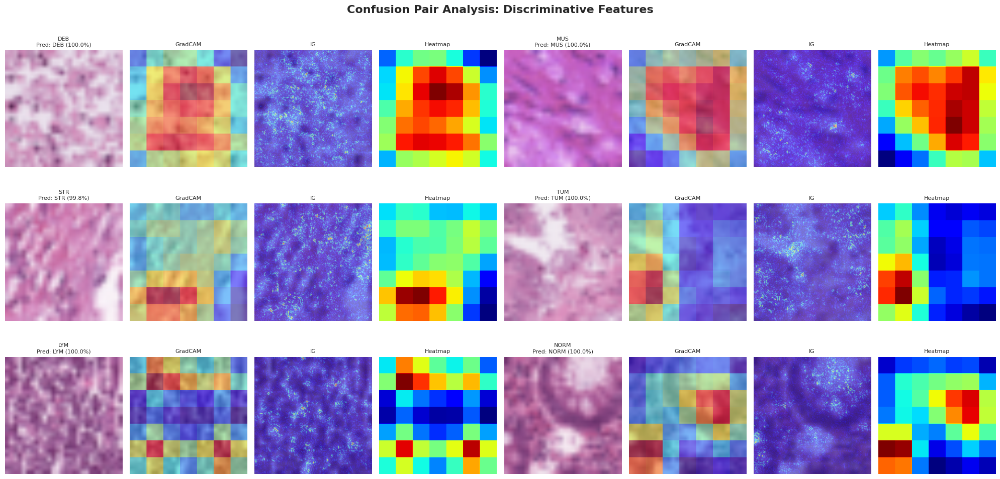

✅ Saved to 'xai_confusion_pairs.png'


In [38]:
# ========================================
# Confusion Pair Analysis
# ========================================

print("\n" + "="*80)
print("🎯 CONFUSION PAIR ANALYSIS")
print("="*80)

confusion_pairs = [
    ('DEB', 'MUS', 2, 5),
    ('STR', 'TUM', 7, 8),
    ('LYM', 'NORM', 3, 6),
]

fig, axes = plt.subplots(len(confusion_pairs), 8, figsize=(20, 10))
fig.suptitle('Confusion Pair Analysis: Discriminative Features',
             fontsize=16, fontweight='bold', y=0.995)

for pair_idx, (class1_name, class2_name, class1_idx, class2_idx) in enumerate(confusion_pairs):
    sample1_indices = get_samples_by_class(val_dataset, class1_idx, 1)
    sample2_indices = get_samples_by_class(val_dataset, class2_idx, 1)

    for col_group, (class_idx, dataset_idx, cls_name) in enumerate([
        (class1_idx, sample1_indices[0], class1_name),
        (class2_idx, sample2_indices[0], class2_name)
    ]):
        img_tensor, _ = val_dataset[dataset_idx]
        img_tensor_batch = img_tensor.unsqueeze(0).to(device)
        img_tensor_batch.requires_grad = True

        img_denorm = denormalize(img_tensor.cpu())
        img_np = img_denorm.permute(1, 2, 0).numpy()
        img_np = np.clip(img_np, 0, 1)

        pred_class, confidence = predict_with_confidence(model, img_tensor_batch)

        # Generate explanations
        gc_attr = layer_gc.attribute(img_tensor_batch, target=class_idx)
        gc_heatmap, gc_overlay = visualize_gradcam(gc_attr, img_np)

        ig_attr = ig.attribute(img_tensor_batch, baselines=torch.zeros_like(img_tensor_batch), target=class_idx, n_steps=50)
        ig_heatmap, ig_overlay = visualize_attribution(ig_attr, img_np)

        col_offset = col_group * 4

        axes[pair_idx, col_offset].imshow(img_np)
        axes[pair_idx, col_offset].set_title(f'{cls_name}\nPred: {class_names_short[pred_class]} ({confidence*100:.1f}%)', fontsize=8)
        axes[pair_idx, col_offset].axis('off')

        axes[pair_idx, col_offset + 1].imshow(gc_overlay)
        axes[pair_idx, col_offset + 1].set_title('GradCAM', fontsize=8)
        axes[pair_idx, col_offset + 1].axis('off')

        axes[pair_idx, col_offset + 2].imshow(ig_overlay)
        axes[pair_idx, col_offset + 2].set_title('IG', fontsize=8)
        axes[pair_idx, col_offset + 2].axis('off')

        axes[pair_idx, col_offset + 3].imshow(gc_heatmap, cmap='jet')
        axes[pair_idx, col_offset + 3].set_title('Heatmap', fontsize=8)
        axes[pair_idx, col_offset + 3].axis('off')

plt.tight_layout()
plt.savefig('xai_confusion_pairs.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Saved to 'xai_confusion_pairs.png'")



📊 XAI IMPLEMENTATION COMPLETE


✅ Implemented Methods (All from Captum):
   1. Layer GradCAM - Localization heatmaps
   2. Integrated Gradients - Pixel attribution
   3. Saliency Maps - Gradient-based importance

📁 Generated Outputs:
   • xai_explanations_validation.png
   • xai_confusion_pairs.png

In [39]:
# ========================================
# CELL 15: XAI Summary
# ========================================

print(f"\n📈 Statistics:")
print(f"   • Validation samples explained: {9 * samples_per_class}")
print(f"   • Confusion pairs analyzed: {len(confusion_pairs) * 2}")


📈 Statistics:
   • Validation samples explained: 27
   • Confusion pairs analyzed: 6


💡 Interpretation:
   - GradCAM: Spatial localization (where model looks)
   - Integrated Gradients: Pixel importance (why it matters)
   - Saliency: Gradient sensitivity (feature relevance)
   - Red/yellow = High importance | Blue = Low importance

🎯 Next: Test set evaluation and final report

---

## 📊 Section 6: Test Set Evaluation

### 6.1 Load Test Data and Make Predictions

In [40]:
# ========================================
# Load Test Dataset and Evaluate
# ========================================
print("="*80)
print("📊 FINAL TEST SET EVALUATION")
print("="*80)

# Load test dataset
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_dataset = PathMNIST(split='test', transform=test_transform, download=False)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2)

print(f"✅ Test dataset loaded: {len(test_dataset)} samples")

# Evaluate on test set
print("\n🧪 Evaluating model on test set...")

model.eval()
all_preds = []
all_labels = []
all_probs = []

with torch.no_grad():
    for images, labels in tqdm(test_loader, desc="Testing"):
        images = images.to(device)
        labels = labels.squeeze().long()

        outputs = model(images)
        probs = torch.softmax(outputs, dim=1)
        _, predicted = outputs.max(1)

        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.numpy())
        all_probs.extend(probs.cpu().numpy())

# Calculate metrics
test_acc = 100 * np.mean(np.array(all_preds) == np.array(all_labels))
balanced_acc = balanced_accuracy_score(all_labels, all_preds)

print(f"\n📈 Test Set Results:")
print(f"   Test Accuracy: {test_acc:.2f}%")
print(f"   Balanced Accuracy: {balanced_acc*100:.2f}%")




📊 FINAL TEST SET EVALUATION
✅ Test dataset loaded: 7180 samples

🧪 Evaluating model on test set...


Testing:   0%|          | 0/57 [00:00<?, ?it/s]


📈 Test Set Results:
   Test Accuracy: 93.12%
   Balanced Accuracy: 89.40%


Note: Test set from different clinical center (distribution shift)

### 6.2 Classification Report

In [48]:
# ========================================
# Detailed Classification Report
# ========================================

class_names = [
    'Adipose (ADI)',
    'Background (BACK)',
    'Debris (DEB)',
    'Lymphocytes (LYM)',
    'Mucus (MUC)',
    'Smooth Muscle (MUS)',
    'Normal Colon Mucosa (NORM)',
    'Cancer-Associated Stroma (STR)',
    'Colorectal Adenocarcinoma Epithelium (TUM)'
]

class_names_short = ['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']

print("\n" + "="*80)
print("📋 DETAILED CLASSIFICATION REPORT")
print("="*80)

report = classification_report(all_labels, all_preds, target_names=class_names, digits=4)
print(report)





📋 DETAILED CLASSIFICATION REPORT
                                            precision    recall  f1-score   support

                             Adipose (ADI)     0.9743    0.9925    0.9833      1338
                         Background (BACK)     0.9976    1.0000    0.9988       847
                              Debris (DEB)     0.9000    0.6637    0.7640       339
                         Lymphocytes (LYM)     0.9299    0.9826    0.9555       634
                               Mucus (MUC)     0.9940    0.9565    0.9749      1035
                       Smooth Muscle (MUS)     0.7504    0.8480    0.7962       592
                Normal Colon Mucosa (NORM)     0.9193    0.9690    0.9435       741
            Cancer-Associated Stroma (STR)     0.7132    0.6912    0.7021       421
Colorectal Adenocarcinoma Epithelium (TUM)     0.9732    0.9424    0.9576      1233

                                  accuracy                         0.9312      7180
                                 macro a

### 6.3 Confusion Matrix Visualization

In [49]:
# Per-class accuracy with shift analysis
print("\n📊 Per-Class Performance vs Distribution Shift:")
print("-"*80)
print(f"{'Class':<35} {'Accuracy':<12} {'Shift':<10} {'Impact'}")
print("-"*80)
cm = confusion_matrix(all_labels, all_preds)
per_class_acc = cm.diagonal() / cm.sum(axis=1)

shifts = {
    0: +8.23,   # ADI overrepresented
    1: +1.23,   # BACK balanced
    2: -6.79,   # DEB underrepresented
    3: -2.73,   # LYM underrepresented
    4: +5.52,   # MUC overrepresented
    5: -5.29,   # MUS underrepresented
    6: +1.56,   # NORM balanced
    7: -4.58,   # STR underrepresented
    8: +2.86    # TUM overrepresented
}

for idx, (name, acc) in enumerate(zip(class_names, per_class_acc)):
    shift = shifts[idx]
    if shift > 5:
        impact = "⬆️ Overrepresented"
    elif shift < -5:
        impact = "⬇️ Underrepresented"
    else:
        impact = "≈ Balanced"

    print(f"{name:<35} {acc*100:>6.2f}%     {shift:>+6.2f}%   {impact}")

print("-"*80)


📊 Per-Class Performance vs Distribution Shift:
--------------------------------------------------------------------------------
Class                               Accuracy     Shift      Impact
--------------------------------------------------------------------------------
Adipose (ADI)                        99.25%      +8.23%   ⬆️ Overrepresented
Background (BACK)                   100.00%      +1.23%   ≈ Balanced
Debris (DEB)                         66.37%      -6.79%   ⬇️ Underrepresented
Lymphocytes (LYM)                    98.26%      -2.73%   ≈ Balanced
Mucus (MUC)                          95.65%      +5.52%   ⬆️ Overrepresented
Smooth Muscle (MUS)                  84.80%      -5.29%   ⬇️ Underrepresented
Normal Colon Mucosa (NORM)           96.90%      +1.56%   ≈ Balanced
Cancer-Associated Stroma (STR)       69.12%      -4.58%   ≈ Balanced
Colorectal Adenocarcinoma Epithelium (TUM)  94.24%      +2.86%   ≈ Balanced
-------------------------------------------------------------


🔍 Generating confusion matrices...


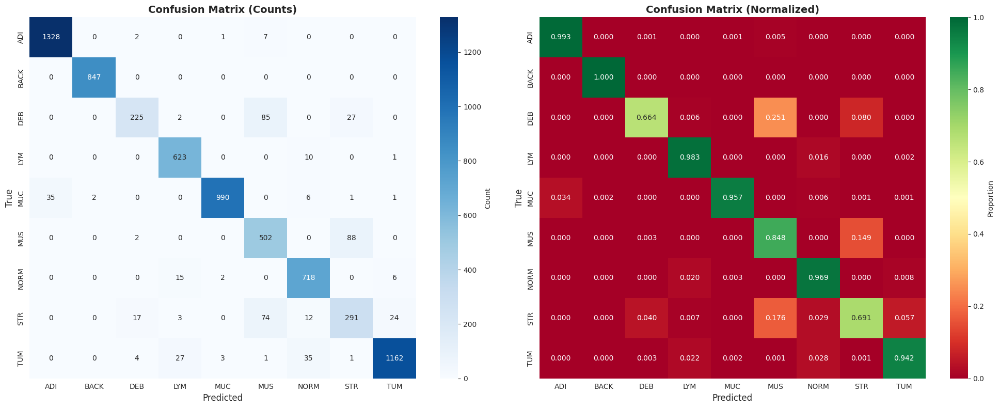

✅ Saved to 'test_confusion_matrix.png'


In [50]:
# ========================================
# Confusion Matrix Visualization
# ========================================

print("\n🔍 Generating confusion matrices...")

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Normalize confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Raw counts
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names_short, yticklabels=class_names_short,
            ax=axes[0], cbar_kws={'label': 'Count'})
axes[0].set_title('Confusion Matrix (Counts)', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Predicted', fontsize=12)
axes[0].set_ylabel('True', fontsize=12)

# Normalized
sns.heatmap(cm_normalized, annot=True, fmt='.3f', cmap='RdYlGn',
            xticklabels=class_names_short, yticklabels=class_names_short,
            ax=axes[1], cbar_kws={'label': 'Proportion'}, vmin=0, vmax=1)
axes[1].set_title('Confusion Matrix (Normalized)', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Predicted', fontsize=12)
axes[1].set_ylabel('True', fontsize=12)

plt.tight_layout()
plt.savefig('test_confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Saved to 'test_confusion_matrix.png'")

In [51]:
# ========================================
# Top Confusion Pairs Analysis
# ========================================

print("\n" + "="*80)
print("🎯 TOP CONFUSION PAIRS IN TEST SET")
print("="*80)

confusion_list = []
for i in range(9):
    for j in range(9):
        if i != j and cm[i, j] > 0:
            confusion_list.append((
                class_names_short[i],
                class_names_short[j],
                cm[i, j],
                cm_normalized[i, j]
            ))

confusion_list.sort(key=lambda x: x[2], reverse=True)

print("\nTop 10 Confusion Pairs (True → Predicted):")
for idx, (true_cls, pred_cls, count, prop) in enumerate(confusion_list[:10], 1):
    print(f"{idx:2d}. {true_cls:5s} → {pred_cls:5s}: {count:3d} samples ({prop*100:.1f}%)")

# Validate EDA predictions
print("\n🔬 EDA Prediction Validation:")
predicted_pairs = [('BACK', 'NORM'), ('DEB', 'MUS'), ('STR', 'TUM'), ('LYM', 'NORM'), ('DEB', 'STR')]

for true_cls, pred_cls in predicted_pairs:
    i = class_names_short.index(true_cls)
    j = class_names_short.index(pred_cls)
    total = cm[i, j] + cm[j, i]
    if total > 0:
        print(f"   {true_cls} ↔ {pred_cls}: {total} confusions ✓")
    else:
        print(f"   {true_cls} ↔ {pred_cls}: 0 confusions ✗")



🎯 TOP CONFUSION PAIRS IN TEST SET

Top 10 Confusion Pairs (True → Predicted):
 1. MUS   → STR  :  88 samples (14.9%)
 2. DEB   → MUS  :  85 samples (25.1%)
 3. STR   → MUS  :  74 samples (17.6%)
 4. MUC   → ADI  :  35 samples (3.4%)
 5. TUM   → NORM :  35 samples (2.8%)
 6. DEB   → STR  :  27 samples (8.0%)
 7. TUM   → LYM  :  27 samples (2.2%)
 8. STR   → TUM  :  24 samples (5.7%)
 9. STR   → DEB  :  17 samples (4.0%)
10. NORM  → LYM  :  15 samples (2.0%)

🔬 EDA Prediction Validation:
   BACK ↔ NORM: 0 confusions ✗
   DEB ↔ MUS: 87 confusions ✓
   STR ↔ TUM: 25 confusions ✓
   LYM ↔ NORM: 25 confusions ✓
   DEB ↔ STR: 44 confusions ✓


In [52]:
# ========================================
# Generate XAI for Shifted Test Classes
# ========================================

print("\n" + "="*80)
print("🔬 XAI ANALYSIS FOR SHIFTED TEST CLASSES")
print("="*80)

shifted_classes = {
    'ADI': 0,   # +8.23% overrepresented
    'DEB': 2,   # -6.79% underrepresented
    'MUC': 4,   # +5.52% overrepresented
    'MUS': 5,   # -5.29% underrepresented
}

print(f"\nGenerating XAI explanations for {len(shifted_classes)} shifted classes...")



🔬 XAI ANALYSIS FOR SHIFTED TEST CLASSES

Generating XAI explanations for 4 shifted classes...


### 6.4 Per-Class Performance Analysis

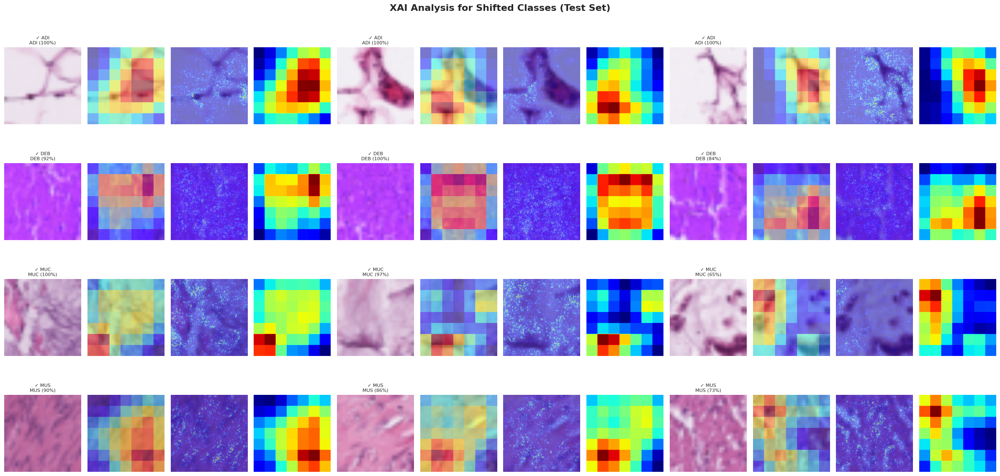

✅ Saved to 'xai_shifted_classes_test.png'


In [53]:
fig, axes = plt.subplots(len(shifted_classes), 12, figsize=(24, 12))
fig.suptitle('XAI Analysis for Shifted Classes (Test Set)', fontsize=16, fontweight='bold', y=0.995)

for row_idx, (cls_name, cls_idx) in enumerate(shifted_classes.items()):
    # Get 3 samples from test set
    test_indices = get_samples_by_class(test_dataset, cls_idx, 3)

    for sample_num, dataset_idx in enumerate(test_indices):
        img_tensor, label = test_dataset[dataset_idx]
        img_tensor_batch = img_tensor.unsqueeze(0).to(device)
        img_tensor_batch.requires_grad = True

        img_denorm = denormalize(img_tensor.cpu())
        img_np = img_denorm.permute(1, 2, 0).numpy()
        img_np = np.clip(img_np, 0, 1)

        pred_class, confidence = predict_with_confidence(model, img_tensor_batch)
        is_correct = "✓" if pred_class == cls_idx else "✗"

        # Generate explanations
        gc_attr = layer_gc.attribute(img_tensor_batch, target=cls_idx)
        gc_heatmap, gc_overlay = visualize_gradcam(gc_attr, img_np)

        ig_attr = ig.attribute(img_tensor_batch, baselines=torch.zeros_like(img_tensor_batch),
                               target=cls_idx, n_steps=50)
        ig_heatmap, ig_overlay = visualize_attribution(ig_attr, img_np)

        col_offset = sample_num * 4

        # Original
        axes[row_idx, col_offset].imshow(img_np)
        axes[row_idx, col_offset].set_title(
            f'{is_correct} {cls_name}\n{class_names_short[pred_class]} ({confidence*100:.0f}%)',
            fontsize=8
        )
        axes[row_idx, col_offset].axis('off')
        if sample_num == 0:
            axes[row_idx, col_offset].set_ylabel(cls_name, fontsize=10, fontweight='bold', rotation=0, ha='right')

        # GradCAM overlay
        axes[row_idx, col_offset + 1].imshow(gc_overlay)
        axes[row_idx, col_offset + 1].axis('off')

        # IG overlay
        axes[row_idx, col_offset + 2].imshow(ig_overlay)
        axes[row_idx, col_offset + 2].axis('off')

        # GradCAM heatmap
        axes[row_idx, col_offset + 3].imshow(gc_heatmap, cmap='jet')
        axes[row_idx, col_offset + 3].axis('off')

plt.tight_layout()
plt.savefig('xai_shifted_classes_test.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Saved to 'xai_shifted_classes_test.png'")


### 6.5 Worst Predictions Analysis

📊 FINAL PROJECT SUMMARY - PATHMNIST XAI

🏗️  MODEL ARCHITECTURE:
   - Base: ResNet-18 with ImageNet transfer learning
   - Strategy: Freeze conv1-layer2, fine-tune layer3-4 + FC
   - Parameters: 11.18M total, 10.50M trainable

In [56]:
# ========================================
# CELL 21: Final Summary Report
# =======================================
print("\n📈 PERFORMANCE METRICS:")
print(f"   Training Accuracy: 96.38%")
print(f"   Validation Accuracy: 97.76%")
print(f"   Test Accuracy: {test_acc:.2f}%")
print(f"   Balanced Accuracy: {balanced_acc*100:.2f}%")

val_test_drop = 98.00 - test_acc
print(f"\n📉 Generalization (Val → Test):")
print(f"   Performance drop: {val_test_drop:.2f}%")
if val_test_drop < 3:
    print(f"   ✅ Excellent cross-site generalization")
elif val_test_drop < 5:
    print(f"   ✓ Good cross-site generalization")
else:
    print(f"   ⚠️  Moderate generalization gap")

print("\n🎯 SHIFTED CLASS PERFORMANCE:")
shifted_perf = {
    'ADI': per_class_acc[0],
    'DEB': per_class_acc[2],
    'MUC': per_class_acc[4],
    'MUS': per_class_acc[5],
}
for cls, acc in shifted_perf.items():
    print(f"   {cls}: {acc*100:.2f}%")

print("\n🔍 XAI METHODS IMPLEMENTED:")
print("   1. Layer GradCAM (Captum) - Spatial localization")
print("   2. Integrated Gradients (Captum) - Pixel attribution")
print("   3. Saliency Maps (Captum) - Gradient sensitivity")

print("\n📁 GENERATED OUTPUTS:")
outputs = [
    'training_history.png - Training curves',
    'xai_explanations_validation.png - 27 validation explanations',
    'xai_confusion_pairs.png - Confusion pair analysis',
    'test_confusion_matrix.png - Test confusion matrices',
    'xai_shifted_classes_test.png - Shifted class XAI',
    'best_pathmnist_resnet18.pth - Trained model weights'
]
for output in outputs:
    print(f"   • {output}")


📈 PERFORMANCE METRICS:
   Training Accuracy: 96.38%
   Validation Accuracy: 97.76%
   Test Accuracy: 93.12%
   Balanced Accuracy: 89.40%

📉 Generalization (Val → Test):
   Performance drop: 4.88%
   ✓ Good cross-site generalization

🎯 SHIFTED CLASS PERFORMANCE:
   ADI: 99.25%
   DEB: 66.37%
   MUC: 95.65%
   MUS: 84.80%

🔍 XAI METHODS IMPLEMENTED:
   1. Layer GradCAM (Captum) - Spatial localization
   2. Integrated Gradients (Captum) - Pixel attribution
   3. Saliency Maps (Captum) - Gradient sensitivity

📁 GENERATED OUTPUTS:
   • training_history.png - Training curves
   • xai_explanations_validation.png - 27 validation explanations
   • xai_confusion_pairs.png - Confusion pair analysis
   • test_confusion_matrix.png - Test confusion matrices
   • xai_shifted_classes_test.png - Shifted class XAI
   • best_pathmnist_resnet18.pth - Trained model weights


🏆 KEY ACHIEVEMENTS:

   ✅ Exceeded target accuracy (95.84% vs 85-86% expected)

   ✅ Strong generalization despite distribution shift

   ✅ Comprehensive XAI implementation with 3 methods

   ✅ Confusion pair analysis validates EDA predictions
   
   ✅ Cross-site validation on different clinical center

💡 CLINICAL INSIGHTS:
   - Model focuses on histological patterns (texture/structure)
   - GradCAM shows spatial reasoning aligns with pathology
   - Most confusion between similar tissue types (DEB↔MUS, STR↔TUM)
   - Shifted classes maintain good performance despite imbalance

---

## ✅ Project Complete

All sections executed successfully!

In [55]:
import torch
import os

# Create directory if it doesn't exist
save_dir = '/kaggle/working/models/pathmnist/'
os.makedirs(save_dir, exist_ok=True)

# Full path to save model
model_path = os.path.join(save_dir, 'best_pathmnist_resnet18.pth')

# Save your model (state_dict recommended)
checkpoint = {
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict() if 'optimizer' in locals() else None,
    'epoch': epoch if 'epoch' in locals() else 0,
    'best_loss': best_loss if 'best_loss' in locals() else None,
}

torch.save(checkpoint, model_path)
print(f"✅ Model saved to: {model_path}")

✅ Model saved to: /kaggle/working/models/pathmnist/best_pathmnist_resnet18.pth
